# Step 4. Modeling Work Using HRS 2000 Data

v 4.0 August 1 2018

These models use the full HRS dataset. For unlabled diagnosis we use kmeans and/or brain_health_3.

**Chosen model classifies label (kmeans) using and expanded feature set **

## Load libraries

In [2]:
# Set up
import pandas as pd
import numpy as np
import scipy as sp

import matplotlib
import matplotlib.pyplot as plt

import pickle as pkl
import seaborn as sns

import itertools
import json

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import validation_curve
from sklearn.model_selection import learning_curve
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import RFECV

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import MinMaxScaler

from sklearn.decomposition import PCA

from sklearn.dummy import DummyClassifier
from sklearn.cluster import KMeans

from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline

from sklearn.metrics import explained_variance_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_auc_score

from sklearn.mixture import GaussianMixture

from sklearn import tree
from sklearn import svm
from sklearn import ensemble
from sklearn import naive_bayes
from sklearn import linear_model


import xgboost as xgb

from feature_selector import FeatureSelector


%load_ext autoreload
%autoreload 2
%matplotlib inline

LOCAL_DIR = '/home/jovyan/notebook/'


## A. Load data


In [3]:
# Load ADAMS data
table_adams = pd.read_csv(LOCAL_DIR + 'brainFitDx/data/sample/model_data_adams.csv')

In [4]:
table_adams.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 856 entries, 0 to 855
Columns: 235 entries, hhidpn to g3060
dtypes: float64(34), int64(201)
memory usage: 1.5 MB


In [5]:
table_adams['adams'] = 1

In [6]:
# Just keep diagnosis
table_adams = table_adams.loc[:,['hhidpn', 'adams','brain_health_diag2']]

In [7]:
# Load  HRS 2000 data
table_2000 = pd.read_csv(LOCAL_DIR + 'brainFitDx/data/sample/model_data_hrs.csv')

In [8]:
table_2000.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19579 entries, 0 to 19578
Columns: 231 entries, hhidpn to g3060
dtypes: float64(34), int64(197)
memory usage: 34.5 MB


In [9]:
# Merge and add in ADAMS diagnosis
df = pd.merge(table_2000,table_adams, how='left', on='hhidpn', suffixes=('', '_y'))

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19579 entries, 0 to 19578
Columns: 233 entries, hhidpn to brain_health_diag2
dtypes: float64(36), int64(197)
memory usage: 35.0 MB


In [11]:
df['g1101'].describe()

count    19579.000000
mean        67.021145
std         10.944663
min          0.000000
25%         59.000000
50%         66.000000
75%         75.000000
max        107.000000
Name: g1101, dtype: float64

In [12]:
df.head(5)

,hhidpn,brain_health_1,brain_health_2,brain_health_3,total_cog,total_recall,serial7,tics,backwards_20,immediate_recall,...,g2916,g2918,g2940,g2995,g2996,g2999,g3002,g3060,adams,brain_health_diag2
0,2010,0,1,1,14.0,8,0,6.0,2,5,...,5,0,0.0,5,0.0,4.0,1,1.0,NaN,NaN
1,3010,0,0,0,24.0,20,4,0.0,2,10,...,5,0,0.0,1,200.0,2.0,1,2.0,NaN,NaN
2,3020,0,0,0,16.0,11,5,0.0,2,6,...,5,0,0.0,1,10.0,0.0,5,2.0,NaN,NaN
3,10001010,0,0,0,19.0,14,5,0.0,2,7,...,5,0,0.0,5,0.0,130.0,1,4.0,NaN,NaN
4,10003030,0,0,0,25.0,20,5,0.0,2,10,...,5,0,0.0,5,0.0,0.0,5,4.0,NaN,NaN


## B. Reduce feature size (Note: Use ADAMS to reduce feature size i.e. target is brain_health_diag2)

We reduce the feature size further, with the ADAMS database providing an "anchor". That is, we reduce based on the ADAMS sub-sample and 856 actual diagnosis.

In [13]:
df_adams = df.loc[df['adams']==1,:]
df_adams.head(5)

,hhidpn,brain_health_1,brain_health_2,brain_health_3,total_cog,total_recall,serial7,tics,backwards_20,immediate_recall,...,g2916,g2918,g2940,g2995,g2996,g2999,g3002,g3060,adams,brain_health_diag2
13,10059030,1,2,1,0.0,0,0,0.0,0,0,...,5,0,0.0,1,52.0,6.0,1,4.0,1.0,0.0
337,12513010,0,1,1,16.0,7,0,9.0,2,3,...,5,0,0.0,1,15.0,25.0,5,2.0,1.0,1.0
360,12588020,0,0,0,26.0,11,5,10.0,2,5,...,5,0,0.0,1,120.0,40.0,1,2.0,1.0,0.0
429,13140010,0,0,0,24.0,12,2,10.0,2,6,...,5,0,0.0,5,0.0,0.0,1,2.0,1.0,0.0
542,13857010,0,0,0,23.0,11,3,9.0,2,6,...,5,0,0.0,1,10.0,0.0,1,2.0,1.0,0.0


In [14]:
target = df_adams['brain_health_diag2']
train_data = df_adams.drop(columns=['hhidpn','brain_health_1','brain_health_2','brain_health_3', 'total_cog', 'adams', 'brain_health_diag2'])

In [15]:
fs = FeatureSelector(data=train_data, labels=target)

In [16]:
fs.identify_all(selection_params = {'missing_threshold': 0.6, 'correlation_threshold': 0.98, 
                                    'task': 'classification', 'eval_metric': 'auc', 
                                     'cumulative_importance': 0.99})

0 features with greater than 0.60 missing values.

9 features with a single unique value.

9 features with a correlation magnitude greater than 0.98.

Training Gradient Boosting Model

Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[59]	valid_0's auc: 0.865385
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[8]	valid_0's auc: 0.882184
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[31]	valid_0's auc: 0.873681
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[19]	valid_0's auc: 0.887874
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[2]	valid_0's auc: 0.919568
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[24]	valid_0's auc: 0.835616
Training until validation scores don't improve for 100 

In [17]:
train_removed_all_once = fs.remove(methods = 'all', keep_one_hot = True)

['missing', 'single_unique', 'collinear', 'zero_importance', 'low_importance'] methods have been run

Removed 86 features.


In [18]:
fs.feature_importances.head(50)

,feature,importance,normalized_importance,cumulative_importance
0,g1101,90.2,0.079986,0.079986
1,g1425,76.0,0.067394,0.147380
2,g2652,68.0,0.060300,0.207679
3,total_recall,63.5,0.056309,0.263989
4,g1814_05,50.8,0.045047,0.309036
5,g1805,43.7,0.038751,0.347788
6,g1074a,41.3,0.036623,0.384411
7,tics,39.3,0.034850,0.419260
8,delayed_recall,27.0,0.023943,0.443203
9,g2851,22.7,0.020129,0.463332


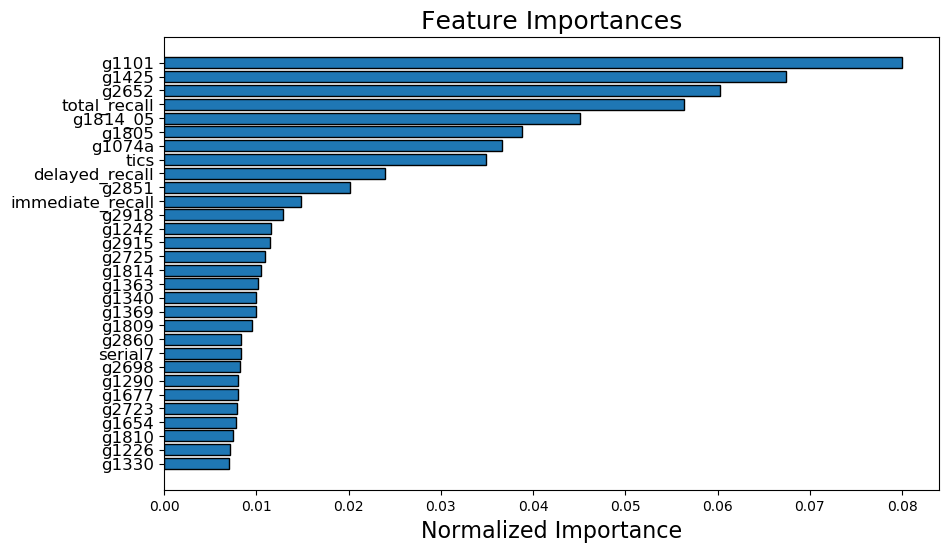

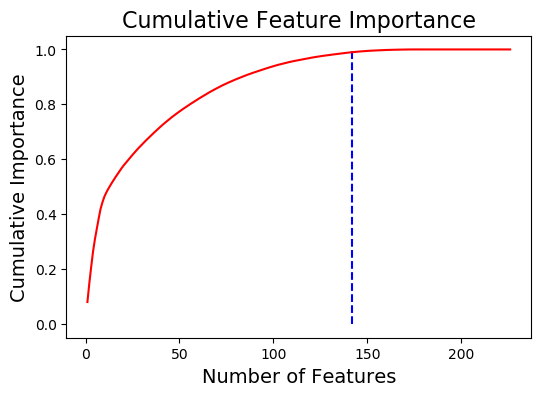

142 features required for 0.99 of cumulative importance


In [19]:
fs.plot_feature_importances(threshold = 0.99, plot_n = 30)

In [20]:
# Reduced set of features
features1 = train_removed_all_once.columns.tolist()

Note that features for last two steps can change (they are affected randomly)

## C. Clustering (Use this to label broader dataset)

Work to determine best clustering method on features which have been chosen above.

In [21]:
df_small = df.loc[:,features1]

In [22]:
df_small.head(5)

,total_recall,serial7,tics,backwards_20,immediate_recall,delayed_recall,g1101,g1074a,g1158,g1092a,...,g2875,g2915,g2916,g2918,g2940,g2995,g2996,g2999,g3002,g3060
0,8,0,6.0,2,5,3,65,8,2,1,...,5,1,5,0,0.0,5,0.0,4.0,1,1.0
1,20,4,0.0,2,10,10,64,12,1,1,...,5,5,5,0,0.0,1,200.0,2.0,1,2.0
2,11,5,0.0,2,6,5,61,16,1,1,...,5,5,5,0,0.0,1,10.0,0.0,5,2.0
3,14,5,0.0,2,7,7,60,12,3,1,...,5,5,5,0,0.0,5,0.0,130.0,1,4.0
4,20,5,0.0,2,10,10,44,16,2,1,...,5,5,5,0,0.0,5,0.0,0.0,5,4.0


**Results on these features are not great (go back to original list)**

 1.0    441
 0.0    252
-1.0    153
dtype: int64
 0.0    670
 1.0     99
-1.0     77
dtype: int64
 1    419
 0    274
-1    153
dtype: int64
-1    8464
 0    7114
 1    4001
dtype: int64


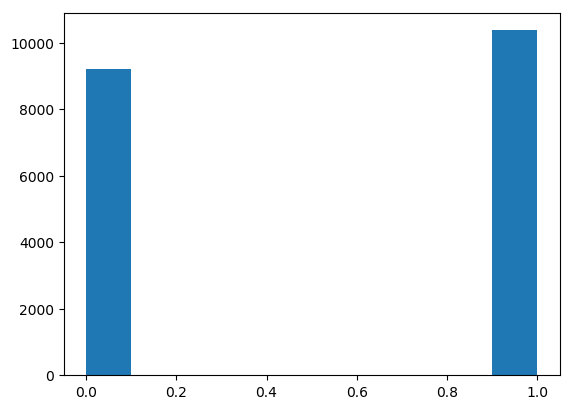

In [23]:
# KMeans

scaler = StandardScaler()
features_std = scaler.fit_transform(df_small)

X = features_std

cluster = KMeans(n_clusters=2, random_state=0, n_jobs=-1)
model = cluster.fit(X)
y_kmeans = model.predict(X)

df['kmeans'] = y_kmeans

df2 = df.loc[df['adams']==1, ['brain_health_diag2', 'brain_health_3','kmeans']]
test = df2['brain_health_diag2'] - df2['kmeans']
print(test.value_counts())
plt.hist(y_kmeans)

# Doctor diag - LW score
test = df2['brain_health_diag2'] - df2['brain_health_3']
print(test.value_counts())

# LW Score - Kmeans
test = df2['brain_health_3'] - df2['kmeans']
print(test.value_counts())

# Doctor diag - Kmeans
test = df['brain_health_3'] - df['kmeans']
print(test.value_counts())

 1.0    472
 0.0    248
-1.0    126
dtype: int64


(array([ 11157.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,   8422.]),
 array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ]),
 <a list of 10 Patch objects>)

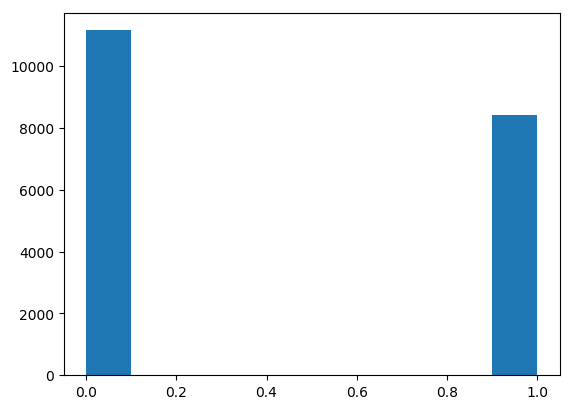

In [24]:
# Agglo Clustering

from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=2)
y_kmeans = cluster.fit_predict(X)

df['test'] = y_kmeans

df2 = df.loc[df['adams']==1, ['brain_health_diag2', 'test']]
test = df2['brain_health_diag2'] - df2['test']
print(test.value_counts())
plt.hist(y_kmeans)

 0.0    624
 1.0    126
-1.0     96
dtype: int64


(array([ 13058.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,   6521.]),
 array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ]),
 <a list of 10 Patch objects>)

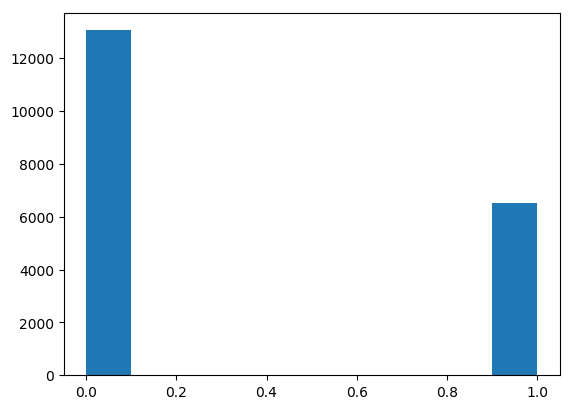

In [25]:
# Gaussian mixture

cluster = GaussianMixture(n_components=2,covariance_type='full', random_state=0)
model = cluster.fit(X)
y_kmeans = model.predict(X)

df['test'] = y_kmeans

df2 = df.loc[df['adams']==1, ['brain_health_diag2', 'test']]
test = df2['brain_health_diag2'] - df2['test']
print(test.value_counts())
plt.hist(df['test'])

In [26]:
# Current shortlist

features0 = ['total_recall', 
            'serial7','tics','backwards_20','immediate_recall','delayed_recall',
            'g1101',
            'g1074a',
            'g1158',
            'g1092a',
            'g1085',
            'g1226',
            'g1240',
            'g1284',
            'g1290',
            'g1317',
            'g1323',
            'g1330',
            'g1374',
            'g1416',
            'g1425',
            'g1710',
            'g1733',
            'g1805',
            'g1814_05',
            'g1814',
            'g1852',
            'g2652',
            'g2725',
            'g2745',
            'g2755',
            'g2847',
            'g2848',
            'g2851',
            'g2865',
            'g2870',
            'g2916',
            'g2918',
            'g2940',
            'g3002',
            'g3060']

In [27]:
df_small = df.loc[:,features0]

In [28]:
df_small.head(5)

,total_recall,serial7,tics,backwards_20,immediate_recall,delayed_recall,g1101,g1074a,g1158,g1092a,...,g2847,g2848,g2851,g2865,g2870,g2916,g2918,g2940,g3002,g3060
0,8,0,6.0,2,5,3,65,8,2,1,...,1,1,0,5,5,5,0,0.0,1,1.0
1,20,4,0.0,2,10,10,64,12,1,1,...,0,0,5,5,5,5,0,0.0,1,2.0
2,11,5,0.0,2,6,5,61,16,1,1,...,0,0,5,5,5,5,0,0.0,5,2.0
3,14,5,0.0,2,7,7,60,12,3,1,...,0,0,5,5,5,5,0,0.0,1,4.0
4,20,5,0.0,2,10,10,44,16,2,1,...,0,0,0,5,5,5,0,0.0,5,4.0


 0.0    637
 1.0    166
-1.0     43
dtype: int64
 0.0    670
 1.0     99
-1.0     77
dtype: int64
 0    705
 1    121
-1     20
dtype: int64
 0    16863
 1     2247
-1      469
dtype: int64


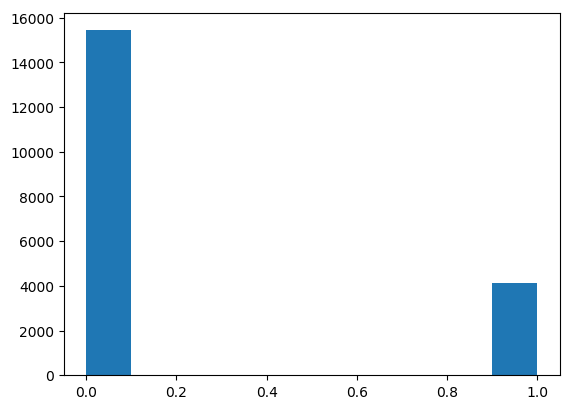

In [29]:
# KMeans

scaler = StandardScaler()
features_std = scaler.fit_transform(df_small)

X = features_std

cluster = KMeans(n_clusters=2, random_state=0, n_jobs=-1)
model = cluster.fit(X)
y_kmeans = model.predict(X)

df['kmeans'] = 1-y_kmeans

df2 = df.loc[df['adams']==1, ['brain_health_diag2', 'brain_health_3','kmeans']]
test = df2['brain_health_diag2'] - df2['kmeans']
print(test.value_counts())
plt.hist((1-y_kmeans))

test = df2['brain_health_diag2'] - df2['brain_health_3']
print(test.value_counts())

test = df2['brain_health_3'] - df2['kmeans']
print(test.value_counts())

test = df['brain_health_3'] - df['kmeans']
print(test.value_counts())

 0.0    485
 1.0    343
-1.0     18
dtype: int64


(array([ 17134.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,   2445.]),
 array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ]),
 <a list of 10 Patch objects>)

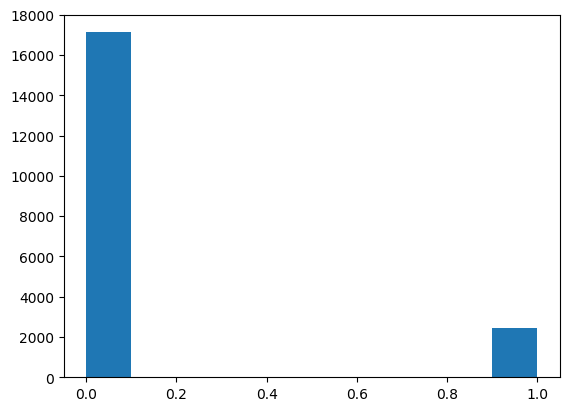

In [30]:
# Agglo Clustering

from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=2)
y_kmeans = cluster.fit_predict(X)

df['test'] = y_kmeans

df2 = df.loc[df['adams']==1, ['brain_health_diag2', 'test']]
test = df2['brain_health_diag2'] - df2['test']
print(test.value_counts())
plt.hist(y_kmeans)

 0.0    586
 1.0    195
-1.0     65
dtype: int64


(array([ 14820.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,   4759.]),
 array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ]),
 <a list of 10 Patch objects>)

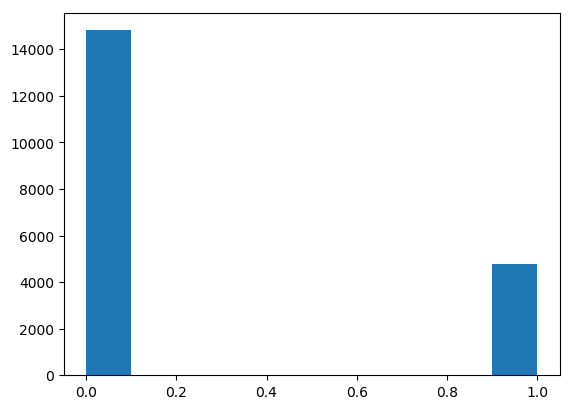

In [31]:
# Gaussian mixture

cluster = GaussianMixture(n_components=2,covariance_type='full', random_state=0)
model = cluster.fit(X)
y_kmeans = model.predict(X)

df['test'] = y_kmeans

df2 = df.loc[df['adams']==1, ['brain_health_diag2', 'test']]
test = df2['brain_health_diag2'] - df2['test']
print(test.value_counts())
plt.hist(df['test'])

In [32]:
# Expanded shortlist

features2 = ['total_recall', 
            'serial7','tics','backwards_20','immediate_recall','delayed_recall',
            'g1101',
            'g1074a',
            'g1142',
            'g1158',
            'g1092a',
            'g1085',
            'g1226',
            'g1240',
            'g1242',
            'g1284',
            'g1289',
            'g1290',
            'g1317',
            'g1323',
            'g1329',
            'g1330',
            'g1332',
            'g1340',
            'g1345',
            'g1361',
            'g1363',
            'g1369',
            'g1374',
            'g1387',
            'g1395',
            'g1416',
            'g1425',
            'g1442',
            'g1654',
            'g1677',
            'g1710',
            'g1733',
            'g1805',
            'g1814_05',
            'g1814',
            'g1852',
            'g2652',
            'g2707',
            'g2710',
            'g2723',
            'g2725',
            'g2726',
            'g2745',
            'g2755',
            'g2847',
            'g2848',
            'g2851',
            'g2860',
            'g2865',
            'g2870',
            'g2915',
            'g2916',
            'g2918',
            'g2940',
            'g3002',
            'g3060',
           'g1_trend_health',
           ]

In [33]:
df_small = df.loc[:,features2]
df_small.head(4)

,total_recall,serial7,tics,backwards_20,immediate_recall,delayed_recall,g1101,g1074a,g1142,g1158,...,g2860,g2865,g2870,g2915,g2916,g2918,g2940,g3002,g3060,g1_trend_health
0,8,0,6.0,2,5,3,65,8,3,2,...,5,5,5,1,5,0,0.0,1,1.0,4
1,20,4,0.0,2,10,10,64,12,1,1,...,5,5,5,5,5,0,0.0,1,2.0,0
2,11,5,0.0,2,6,5,61,16,1,1,...,5,5,5,5,5,0,0.0,5,2.0,4
3,14,5,0.0,2,7,7,60,12,3,3,...,5,5,5,5,5,0,0.0,1,4.0,0


 0.0    638
 1.0    148
-1.0     60
dtype: int64
 0.0    670
 1.0     99
-1.0     77
dtype: int64
 0    656
 1    128
-1     62
dtype: int64
 0    15658
 1     2620
-1     1301
dtype: int64


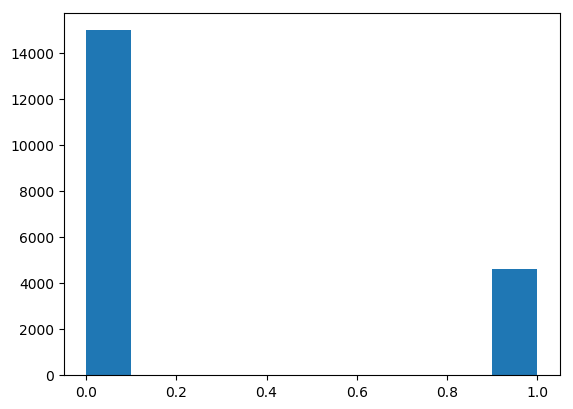

In [34]:
# KMeans

scaler = StandardScaler()
features_std = scaler.fit_transform(df_small)

X = features_std

cluster = KMeans(n_clusters=2, random_state=0, n_jobs=-1)
model = cluster.fit(X)
y_kmeans = model.predict(X)

df['kmeans'] = 1-y_kmeans

df2 = df.loc[df['adams']==1, ['brain_health_diag2', 'brain_health_3','kmeans']]
test = df2['brain_health_diag2'] - df2['kmeans']
print(test.value_counts())
plt.hist((1-y_kmeans))

test = df2['brain_health_diag2'] - df2['brain_health_3']
print(test.value_counts())

test = df2['brain_health_3'] - df2['kmeans']
print(test.value_counts())

test = df['brain_health_3'] - df['kmeans']
print(test.value_counts())

 0.0    592
 1.0    176
-1.0     78
dtype: int64


(array([ 14772.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,   4807.]),
 array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ]),
 <a list of 10 Patch objects>)

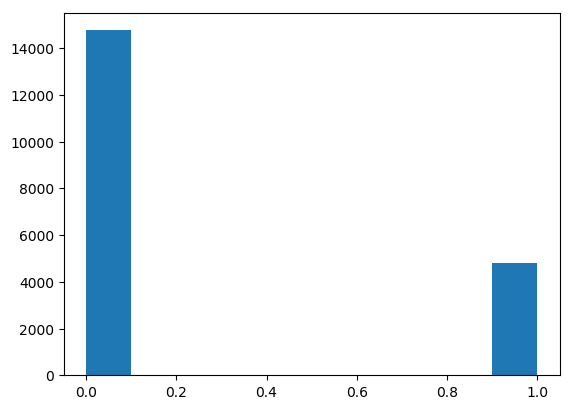

In [35]:
# Gaussian mixture

cluster = GaussianMixture(n_components=2,covariance_type='full', random_state=0)
model = cluster.fit(X)
y_kmeans = model.predict(X)

df['test'] = y_kmeans

df2 = df.loc[df['adams']==1, ['brain_health_diag2', 'test']]
test = df2['brain_health_diag2'] - df2['test']
print(test.value_counts())
plt.hist(df['test'])

**CONCLUSION => USE EXPANDED LIST TO LABEL **

In [36]:
#scaler = StandardScaler()
#caler = Normalizer()
scaler = MinMaxScaler()
features_std = scaler.fit_transform(df_small)
#features_std = scale(df_small)

## D. Visualization - Examine data using PCA

In [37]:
# Total explained variance
pca = PCA()
pca.fit(features_std)
cumsum = np.cumsum(pca.explained_variance_ratio_)
d = np.argmax(cumsum >= 0.95) + 1

print ('Total Explained variance: {}'.format(sum(pca.explained_variance_ratio_)))
print ('Number of Dimensions: {}'.format(d))

Total Explained variance: 1.0000000000000002
Number of Dimensions: 39


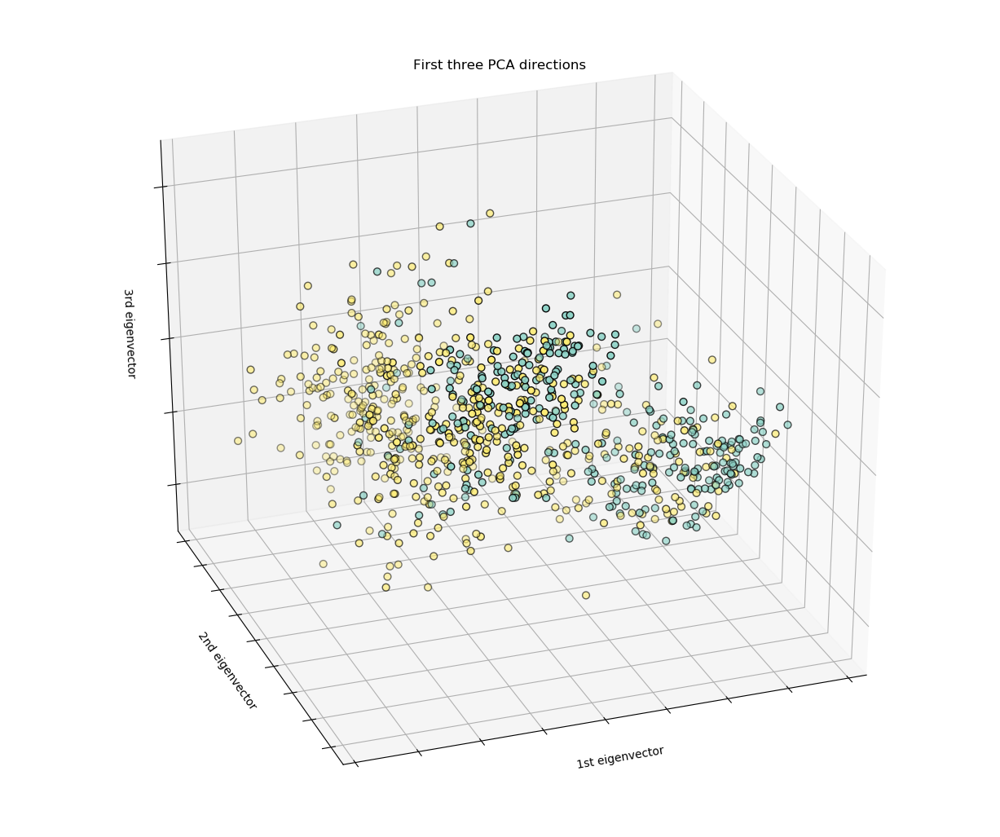

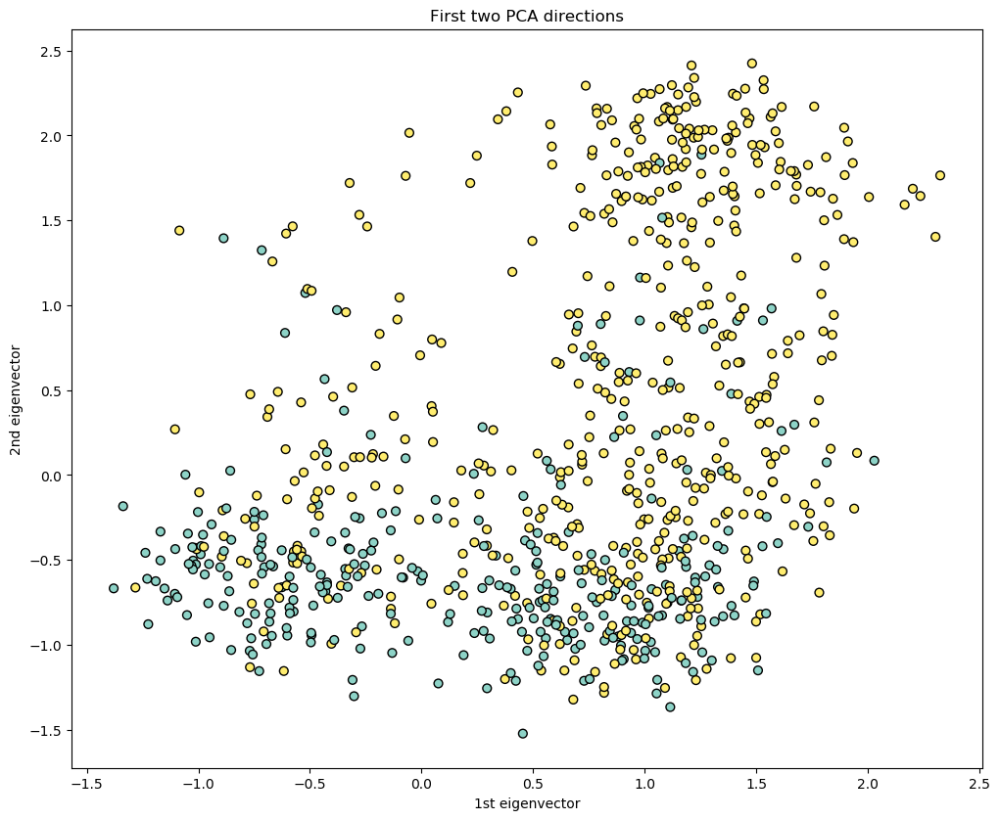

In [38]:
# PCA (ADAMS Diag)

X_reduced = PCA(n_components=3).fit_transform(features_std)
X_reduced.shape

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(1, figsize=(12, 10))
ax = Axes3D(fig, elev=-150, azim=110)
ax.scatter(X_reduced[:, 0], X_reduced[:, 1], X_reduced[:, 2], c=df['brain_health_diag2'],
           cmap=plt.cm.Set3, edgecolor='k', s=40)
ax.set_title("First three PCA directions")
ax.set_xlabel("1st eigenvector")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
ax.w_zaxis.set_ticklabels([])

plt.show()

X_reduced = PCA(n_components=2).fit_transform(features_std)
X_reduced.shape

fig = plt.figure(1, figsize=(12, 10))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=df['brain_health_diag2'],
           cmap=plt.cm.Set3, edgecolor='k', s=40)
plt.title("First two PCA directions")
plt.xlabel("1st eigenvector")
plt.ylabel("2nd eigenvector")

plt.show()


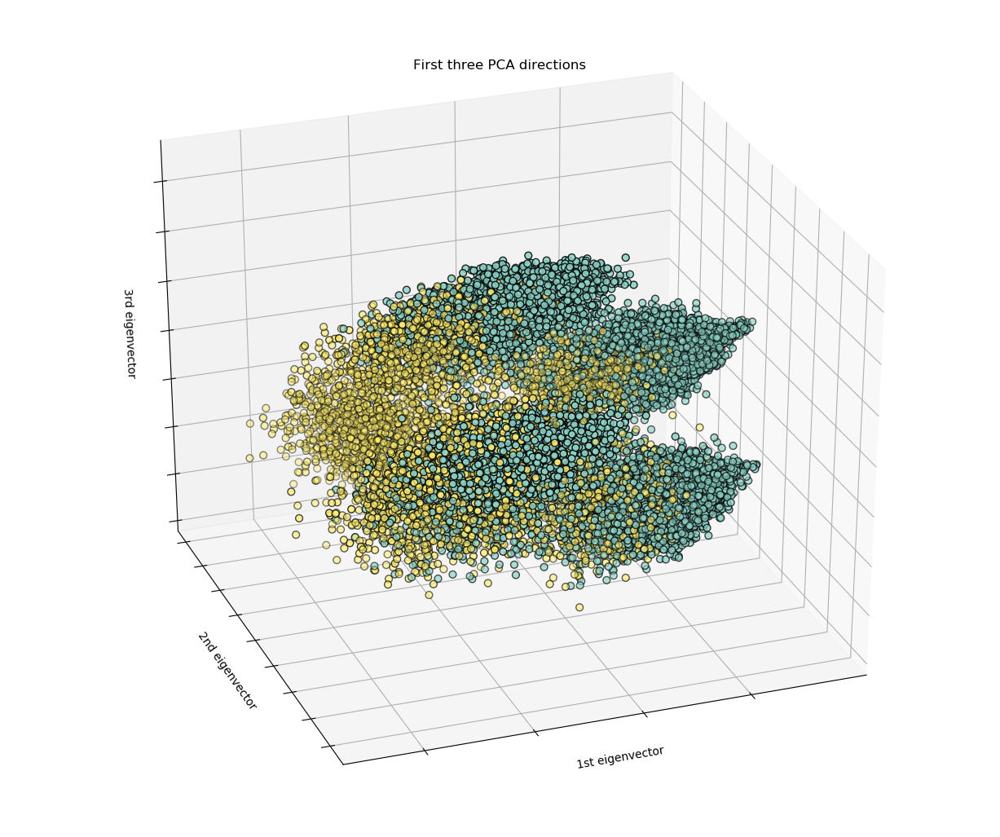

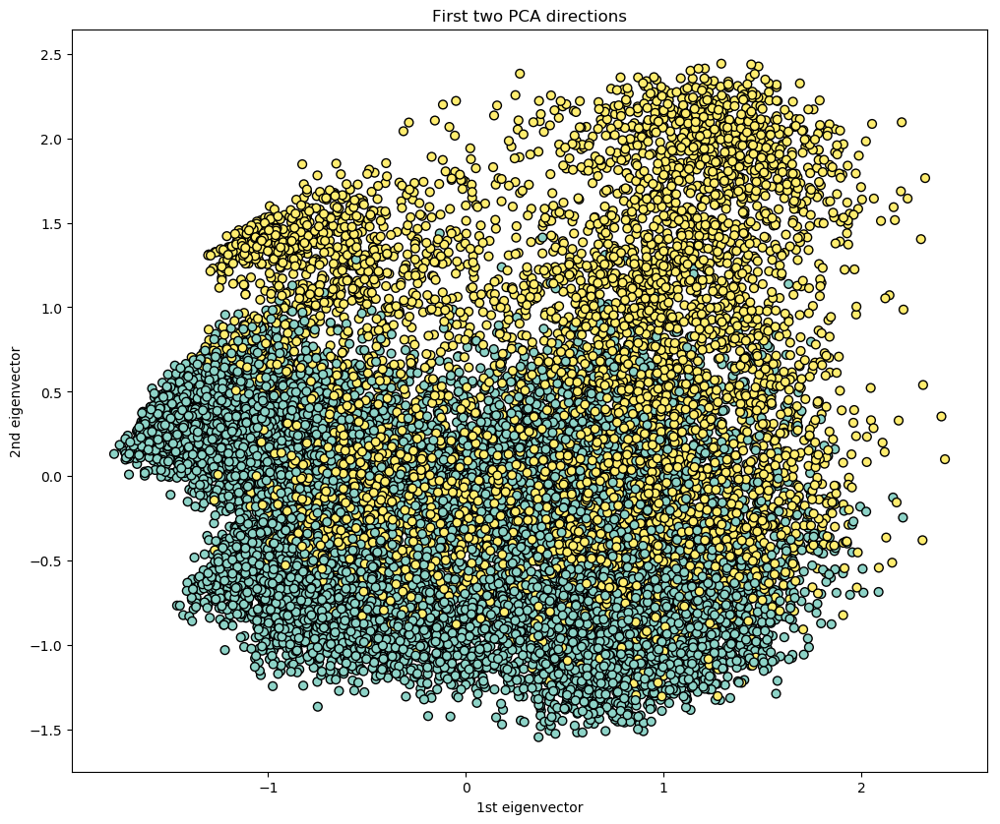

In [39]:
# PCA (BrainHealth Label)

X_reduced = PCA(n_components=3).fit_transform(features_std)
X_reduced.shape

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(1, figsize=(12, 10))
ax = Axes3D(fig, elev=-150, azim=110)
ax.scatter(X_reduced[:, 0], X_reduced[:, 1], X_reduced[:, 2], c=df['brain_health_3'],
           cmap=plt.cm.Set3, edgecolor='k', s=40)
ax.set_title("First three PCA directions")
ax.set_xlabel("1st eigenvector")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
ax.w_zaxis.set_ticklabels([])

plt.show()

X_reduced = PCA(n_components=2).fit_transform(features_std)
X_reduced.shape

fig = plt.figure(1, figsize=(12, 10))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=df['brain_health_3'],
           cmap=plt.cm.Set3, edgecolor='k', s=40)
plt.title("First two PCA directions")
plt.xlabel("1st eigenvector")
plt.ylabel("2nd eigenvector")

plt.show()


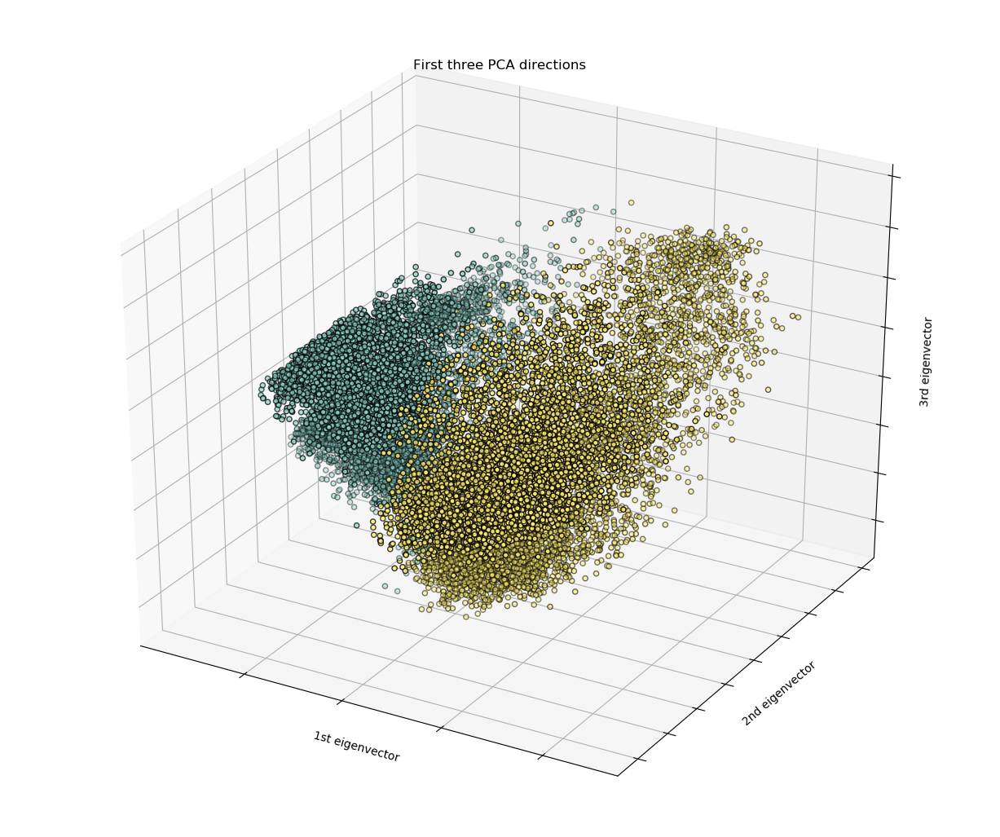

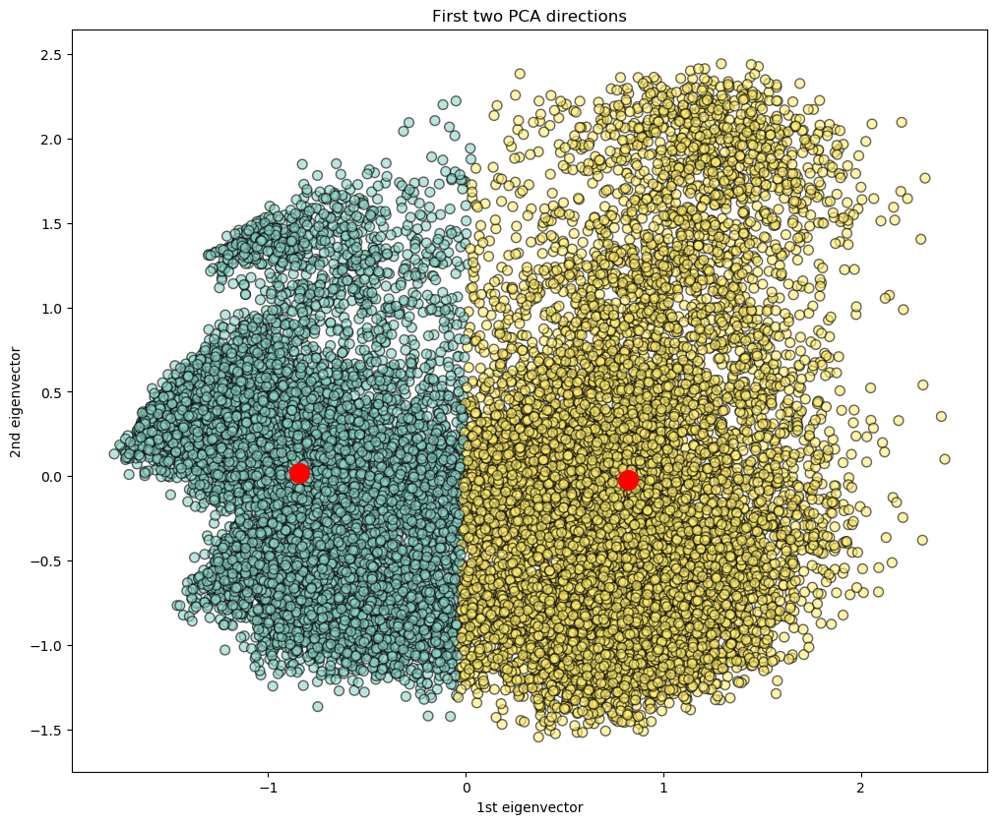

In [40]:
X_reduced = PCA(n_components=3).fit_transform(features_std)
#X_reduced.shape

from mpl_toolkits.mplot3d import Axes3D

cluster = KMeans(n_clusters=2, random_state=0, n_jobs=-1)
model = cluster.fit(X_reduced)
y_kmeans = model.predict(X_reduced)

fig = plt.figure(1, figsize=(12, 10))
ax = Axes3D(fig) #elev=-50, azim=90
ax.scatter(X_reduced[:, 0], X_reduced[:, 1], X_reduced[:, 2], c=y_kmeans,
           cmap=plt.cm.Set3, edgecolor='k', s=20)
centers = model.cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], centers[:,2], c='red', s=200, alpha=1);
ax.set_title("First three PCA directions")
ax.set_xlabel("1st eigenvector")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
ax.w_zaxis.set_ticklabels([])

plt.show()

X_reduced = PCA(n_components=2).fit_transform(features_std)
#X_reduced.shape

cluster = KMeans(n_clusters=2, random_state=0, n_jobs=-1)
model = cluster.fit(X_reduced)
y_kmeans = model.predict(X_reduced)


fig = plt.figure(1, figsize=(12, 10))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y_kmeans,
           cmap=plt.cm.Set3, edgecolor='k', s=50, alpha=0.6)
centers = model.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=1);
plt.title("First two PCA directions")
plt.xlabel("1st eigenvector")
plt.ylabel("2nd eigenvector")
plt.show()

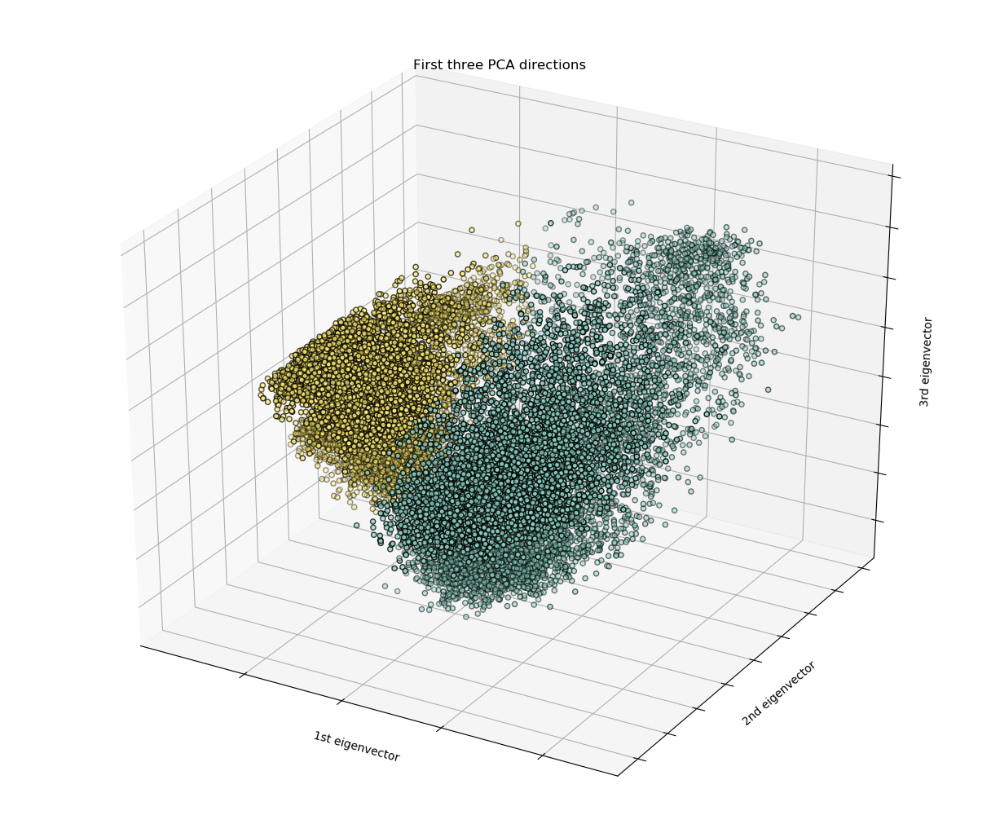

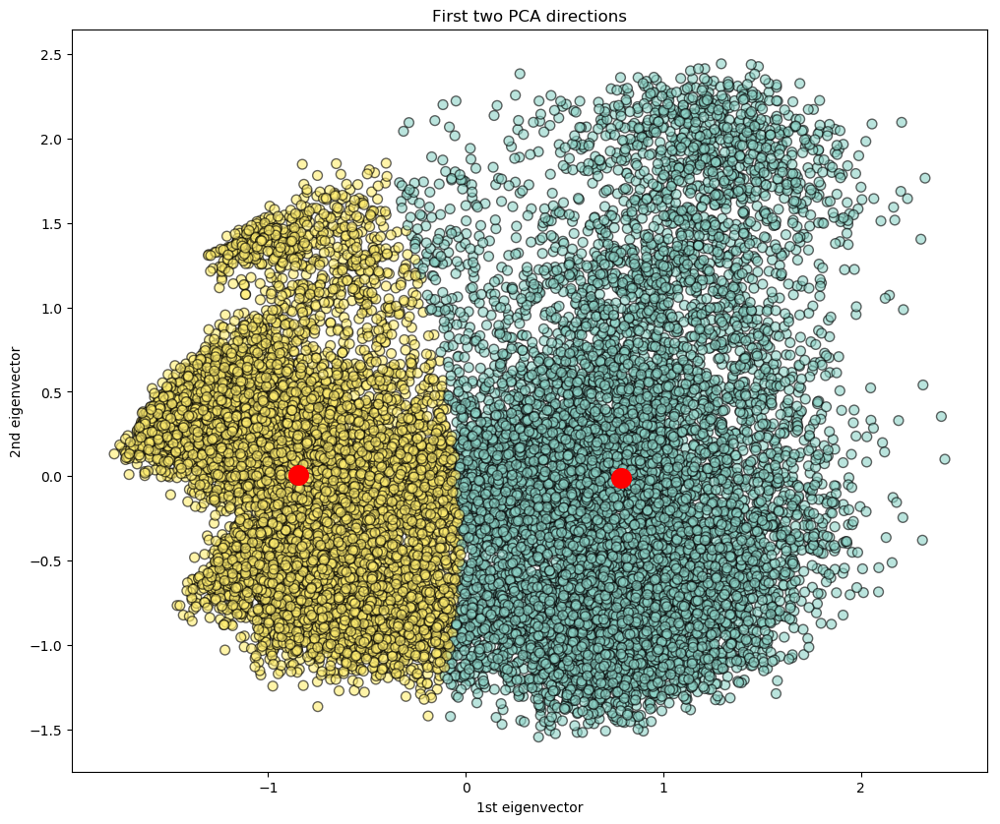

In [41]:
X_reduced = PCA(n_components=3).fit_transform(features_std)

from mpl_toolkits.mplot3d import Axes3D

cluster = GaussianMixture(n_components=2, covariance_type='full', random_state=0)
model = cluster.fit(X_reduced)
y_cluster = model.predict(X_reduced)

fig = plt.figure(1, figsize=(12, 10))
ax = Axes3D(fig) #elev=-50, azim=90
ax.scatter(X_reduced[:, 0], X_reduced[:, 1], X_reduced[:, 2], c=y_cluster,
           cmap=plt.cm.Set3, edgecolor='k', s=20)
centers = model.means_
ax.scatter(centers[:, 0], centers[:, 1], centers[:,2], c='red', s=200, alpha=1);
ax.set_title("First three PCA directions")
ax.set_xlabel("1st eigenvector")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
ax.w_zaxis.set_ticklabels([])

plt.show()

X_reduced = PCA(n_components=2).fit_transform(features_std)

cluster = GaussianMixture(n_components=2, covariance_type='full', random_state=0)
model = cluster.fit(X_reduced)
y_cluster = model.predict(X_reduced)


fig = plt.figure(1, figsize=(12, 10))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y_cluster,
           cmap=plt.cm.Set3, edgecolor='k', s=50, alpha=0.6)
centers = model.means_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=1);
plt.title("First two PCA directions")
plt.xlabel("1st eigenvector")
plt.ylabel("2nd eigenvector")
plt.show()

## E. Visualization - Examine data using TSNE



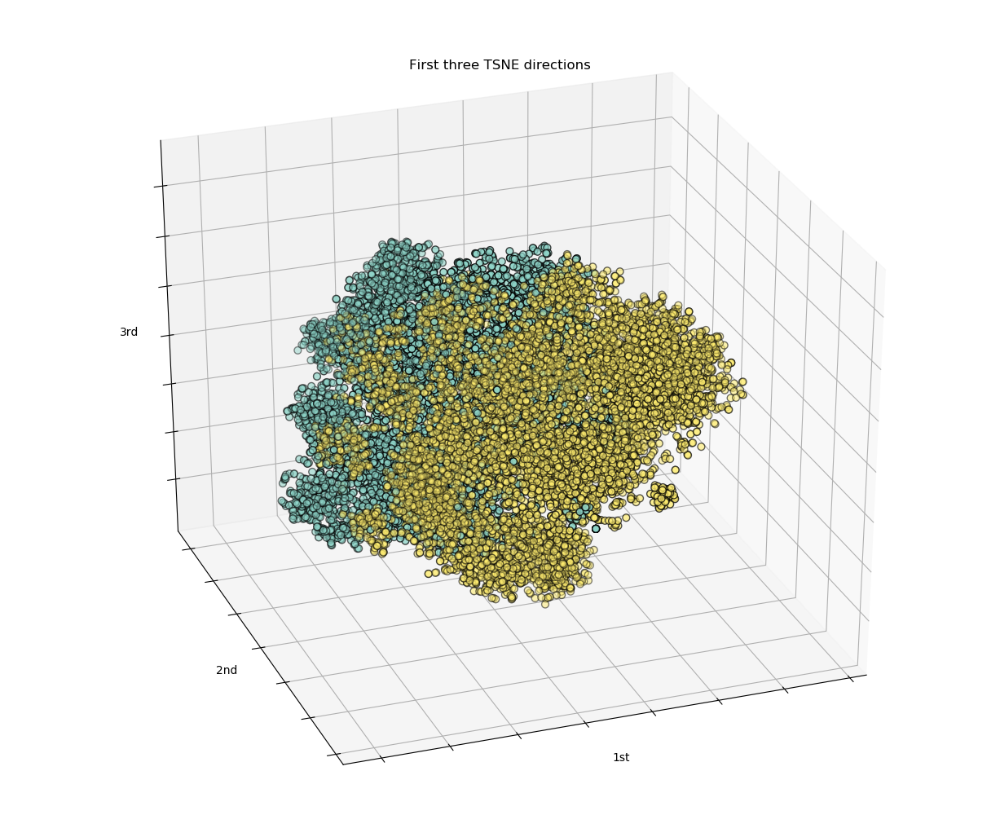

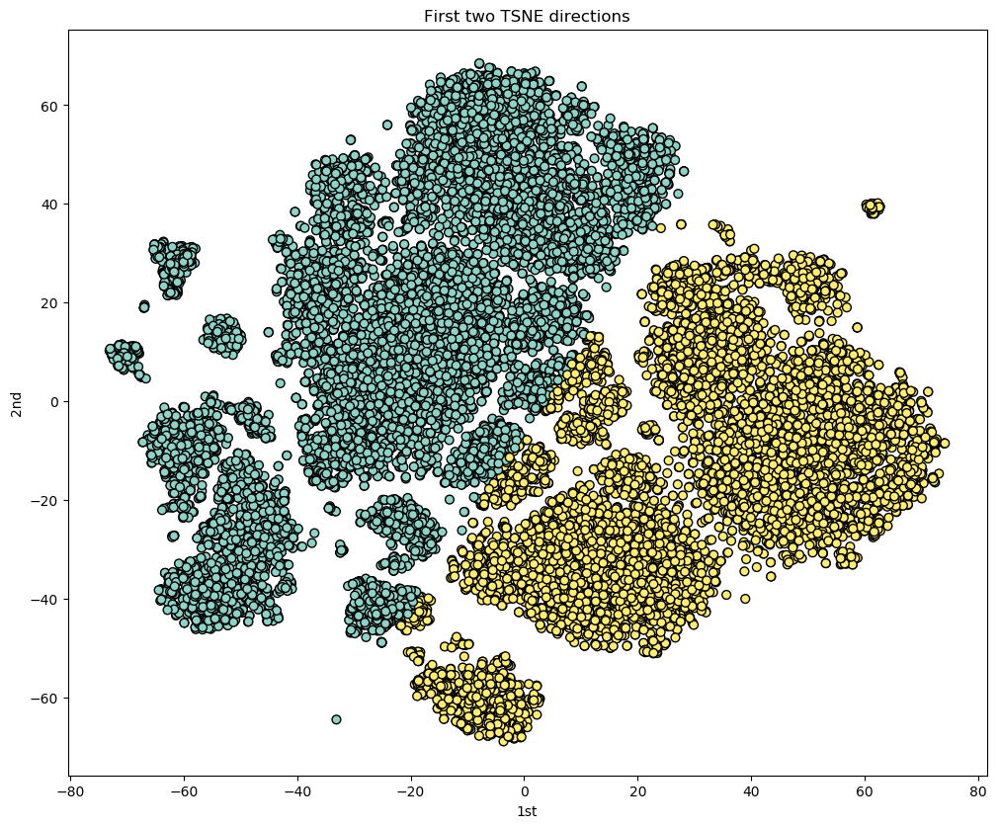

In [45]:
from sklearn.manifold import TSNE

X_reduced = TSNE(n_components=3, init='random', random_state=0).fit_transform(features_std)

cluster = KMeans(n_clusters=2, random_state=0, n_jobs=-1)
model = cluster.fit(X_reduced)
y_kmeans = model.predict(X_reduced)


from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(1, figsize=(12, 10))
ax = Axes3D(fig, elev=-150, azim=110)
ax.scatter(X_reduced[:, 0], X_reduced[:, 1], X_reduced[:, 2], c=y_kmeans,
           cmap=plt.cm.Set3, edgecolor='k', s=40)
ax.set_title("First three TSNE directions")
ax.set_xlabel("1st")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd")
ax.w_zaxis.set_ticklabels([])

plt.show()

X_reduced = TSNE(n_components=2, init='random', random_state=0).fit_transform(features_std)
cluster = KMeans(n_clusters=2, random_state=0, n_jobs=-1)
model = cluster.fit(X_reduced)
y_kmeans = model.predict(X_reduced)

fig = plt.figure(1, figsize=(12, 10))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y_kmeans,
           cmap=plt.cm.Set3, edgecolor='k', s=40)
plt.title("First two TSNE directions")
plt.xlabel("1st")
plt.ylabel("2nd")
plt.show()


## F. K-means (vs Gaussian Mixture, Agglo) is best. 50 features is best vs 140

So we use this to label the full HRS dataset.


 0.0    638
 1.0    148
-1.0     60
dtype: int64
 0.0    670
 1.0     99
-1.0     77
dtype: int64
 0    656
 1    128
-1     62
dtype: int64
 0    15658
 1     2620
-1     1301
dtype: int64


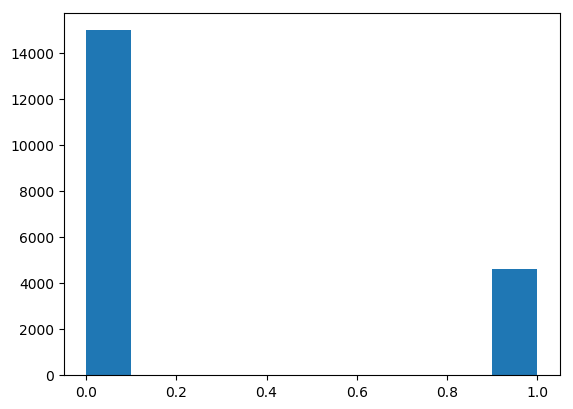

In [36]:
# Create label

scaler = StandardScaler()
features_std = scaler.fit_transform(df_small)

X = features_std

cluster = KMeans(n_clusters=2, random_state=0, n_jobs=-1)
model = cluster.fit(X)
y_kmeans = model.predict(X)

df['kmeans'] = 1-y_kmeans

df2 = df.loc[df['adams']==1, ['brain_health_diag2', 'brain_health_3','kmeans']]
test = df2['brain_health_diag2'] - df2['kmeans']
print(test.value_counts())
plt.hist(df['kmeans'])

test = df2['brain_health_diag2'] - df2['brain_health_3']
print(test.value_counts())

test = df2['brain_health_3'] - df2['kmeans']
print(test.value_counts())

test = df['brain_health_3'] - df['kmeans']
print(test.value_counts())

In [37]:
df.drop(columns=['test'],inplace=True)
df.head(5)

,hhidpn,brain_health_1,brain_health_2,brain_health_3,total_cog,total_recall,serial7,tics,backwards_20,immediate_recall,...,g2918,g2940,g2995,g2996,g2999,g3002,g3060,adams,brain_health_diag2,kmeans
0,2010,0,1,1,14.0,8,0,6.0,2,5,...,0,0.0,5,0.0,4.0,1,1.0,NaN,NaN,0
1,3010,0,0,0,24.0,20,4,0.0,2,10,...,0,0.0,1,200.0,2.0,1,2.0,NaN,NaN,0
2,3020,0,0,0,16.0,11,5,0.0,2,6,...,0,0.0,1,10.0,0.0,5,2.0,NaN,NaN,0
3,10001010,0,0,0,19.0,14,5,0.0,2,7,...,0,0.0,5,0.0,130.0,1,4.0,NaN,NaN,0
4,10003030,0,0,0,25.0,20,5,0.0,2,10,...,0,0.0,5,0.0,0.0,5,4.0,NaN,NaN,0


In [38]:
# Save raw file
#df.to_csv('/home/jovyan/notebook/brainFitDx/data/sample/sample_2000_for_model.csv', index=False)
#df = pd.read_csv('/home/jovyan/notebook/brainFitDx/data/sample/sample_2000_for_model.csv')

## G. Model with Kmean labels, large and small feature sets

In [39]:
# Define feature sets
features1 = train_removed_all_once.columns.tolist()
features2 = features2

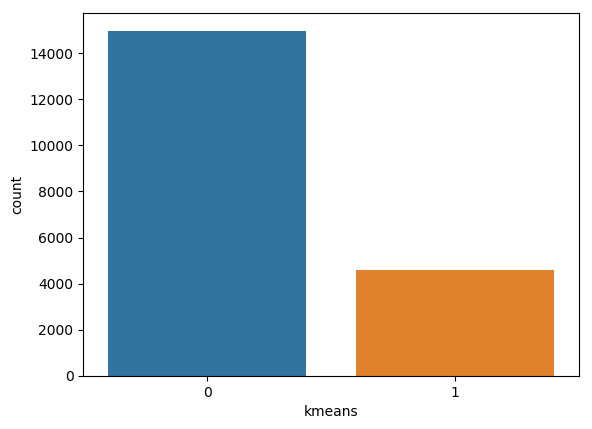

In [41]:
# Data table [140 features]
X = df.loc[:,features1]
y = df['kmeans']

sns.countplot(df['kmeans'])

In [47]:
y.count()

19579

In [48]:
# Make the pipeline
# k_value = 'all'

pipe_lr = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        linear_model.LogisticRegression(random_state=0))

pipe_nb = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        naive_bayes.GaussianNB())

pipe_sv = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        svm.SVC(random_state=0))

pipe_dt = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        tree.DecisionTreeClassifier(random_state=0))

pipe_en = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        ensemble.AdaBoostClassifier(random_state=0))

pipe_xgb = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        xgb.XGBClassifier(random_state=0))

pipe_gb  = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        ensemble.GradientBoostingClassifier(random_state=0))



pipelines = [pipe_lr, pipe_nb, pipe_sv, pipe_dt, pipe_en, pipe_xgb, pipe_gb]
pipe_dict = {0: 'Logistic Regression', 1: 'Naive Bayes', 2: 'Suppor Vector Machine', 3: 'Decision Tress',
            4: 'Ada Boosting Tree', 5: 'XGBoost', 6:'Gradient Boosting'}


In [49]:
# Process pipeline
best_score = 0.0
best_clf = 0

for idx, pipe in enumerate(pipelines):
    score = np.mean(cross_val_score(pipe, X, y.values.ravel(), cv=5, scoring='f1_micro'))
    print ('{!s} accuracy is: {:.3f}'.format(pipe_dict[idx], round(100*score, 3)))
    if best_score <= score:
        best_score = score
        best_clf = idx

print ('*'*82)
print ('\nBest classifier is: {} with accuracy of: {:.3f}\n'.format(pipe_dict[best_clf], round(100*best_score,3)))


Logistic Regression accuracy is: 99.244
Naive Bayes accuracy is: 91.031
Suppor Vector Machine accuracy is: 97.931
Decision Tress accuracy is: 91.184
Ada Boosting Tree accuracy is: 96.987
XGBoost accuracy is: 96.404
Gradient Boosting accuracy is: 96.476
**********************************************************************************

Best classifier is: Logistic Regression with accuracy of: 99.244



In [50]:
# Data table [original features]
X = df.loc[:,features0]
y = df['kmeans']

In [51]:
y.count()

19579

In [52]:
# Make the pipeline
# k_value = 'all'

pipe_lr = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        linear_model.LogisticRegression(random_state=0))

pipe_nb = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        naive_bayes.GaussianNB())

pipe_sv = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        svm.SVC(random_state=0))

pipe_dt = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        tree.DecisionTreeClassifier(random_state=0))

pipe_en = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        ensemble.AdaBoostClassifier(random_state=0))

pipe_xgb = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        xgb.XGBClassifier(random_state=0))

pipe_gb  = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        ensemble.GradientBoostingClassifier(random_state=0))



pipelines = [pipe_lr, pipe_nb, pipe_sv, pipe_dt, pipe_en, pipe_xgb, pipe_gb]
pipe_dict = {0: 'Logistic Regression', 1: 'Naive Bayes', 2: 'Suppor Vector Machine', 3: 'Decision Tress',
            4: 'Ada Boosting Tree', 5: 'XGBoost', 6:'Gradient Boosting'}


In [53]:
# Process pipeline
best_score = 0.0
best_clf = 0

for idx, pipe in enumerate(pipelines):
    score = np.mean(cross_val_score(pipe, X, y.values.ravel(), cv=5, scoring='f1_micro'))
    print ('{!s} accuracy is: {:.3f}'.format(pipe_dict[idx], round(100*score, 3)))
    if best_score <= score:
        best_score = score
        best_clf = idx

print ('*'*82)
print ('\nBest classifier is: {} with accuracy of: {:.3f}\n'.format(pipe_dict[best_clf], round(100*best_score,3)))


Logistic Regression accuracy is: 95.214
Naive Bayes accuracy is: 91.164
Suppor Vector Machine accuracy is: 94.836
Decision Tress accuracy is: 90.725
Ada Boosting Tree accuracy is: 95.066
XGBoost accuracy is: 94.734
Gradient Boosting accuracy is: 94.734
**********************************************************************************

Best classifier is: Logistic Regression with accuracy of: 95.214



In [54]:
# Data table [63 features]
X = df.loc[:,features2]
y = df['kmeans']

In [55]:
y.count()

19579

In [56]:
# Make the pipeline
# k_value = 'all'

pipe_lr = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        linear_model.LogisticRegression(random_state=0))

pipe_nb = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        naive_bayes.GaussianNB())

pipe_sv = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        svm.SVC(random_state=0))

pipe_dt = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        tree.DecisionTreeClassifier(random_state=0))

pipe_en = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        ensemble.AdaBoostClassifier(random_state=0))

pipe_xgb = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        xgb.XGBClassifier(random_state=0))

pipe_gb  = make_pipeline(StandardScaler(), #SelectKBest(mutual_info_classif, k=k_value),
                        ensemble.GradientBoostingClassifier(random_state=0))



pipelines = [pipe_lr, pipe_nb, pipe_sv, pipe_dt, pipe_en, pipe_xgb, pipe_gb]
pipe_dict = {0: 'Logistic Regression', 1: 'Naive Bayes', 2: 'Suppor Vector Machine', 3: 'Decision Tress',
            4: 'Ada Boosting Tree', 5: 'XGBoost', 6:'Gradient Boosting'}


In [57]:
# Process pipeline
best_score = 0.0
best_clf = 0

for idx, pipe in enumerate(pipelines):
    score = np.mean(cross_val_score(pipe, X, y.values.ravel(), cv=5, scoring='f1_micro'))
    print ('{!s} accuracy is: {:.3f}'.format(pipe_dict[idx], round(100*score, 3)))
    if best_score <= score:
        best_score = score
        best_clf = idx

print ('*'*82)
print ('\nBest classifier is: {} with accuracy of: {:.3f}\n'.format(pipe_dict[best_clf], round(100*best_score,3)))


Logistic Regression accuracy is: 99.520
Naive Bayes accuracy is: 92.829
Suppor Vector Machine accuracy is: 98.468
Decision Tress accuracy is: 91.424
Ada Boosting Tree accuracy is: 97.339
XGBoost accuracy is: 96.501
Gradient Boosting accuracy is: 96.466
**********************************************************************************

Best classifier is: Logistic Regression with accuracy of: 99.520



## H. Using XGBoost

Why? 
* Fast
* Works well with sparse matrices
* Robust to scaling
* Robust to overfitting


Optimal number of features : 42


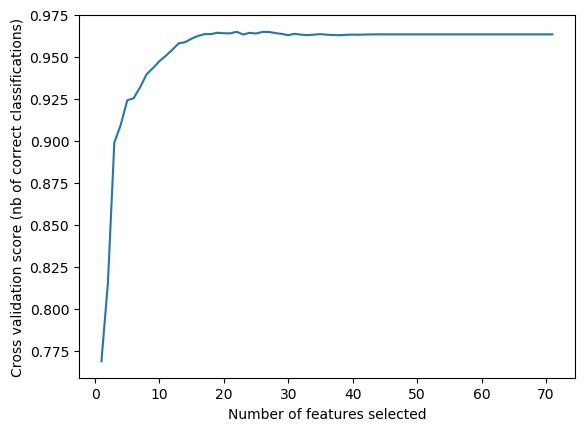

In [42]:
# Using REFECV to choose features

X = df.loc[:,features1]
# Examaine features
X_transformed = StandardScaler().fit_transform(X)

# Create the RFE object and compute a cross-validated score.

clf = xgb.XGBClassifier(random_state=0)
# The "accuracy" scoring is proportional to the number of correct
# classifications
rfecv = RFECV(estimator=clf, step=2, cv=StratifiedKFold(5),
              scoring='f1_micro')
rfecv.fit(X, y)

print("Optimal number of features : %d" % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)

Text(0.5,1,'Feature Importance')

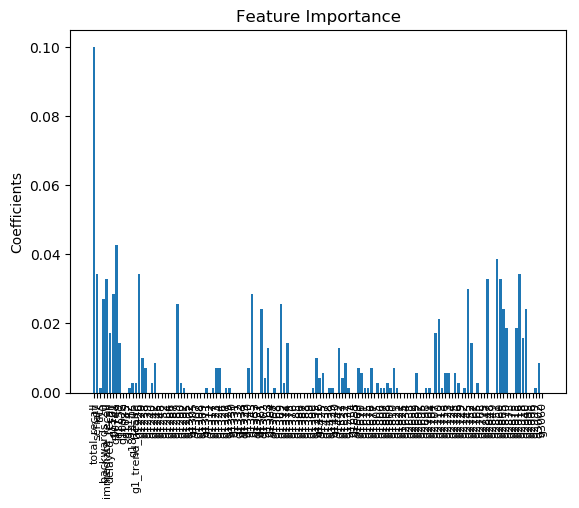

In [43]:
# Just plot features

model = clf.fit(X, y)

x = model.feature_importances_
names = X.columns.tolist()
y_pos = np.arange(len(names))

plt.bar(y_pos, x,)
plt.xticks(y_pos, names, rotation='vertical', fontsize=8)
plt.ylabel('Coefficients')
plt.title('Feature Importance')

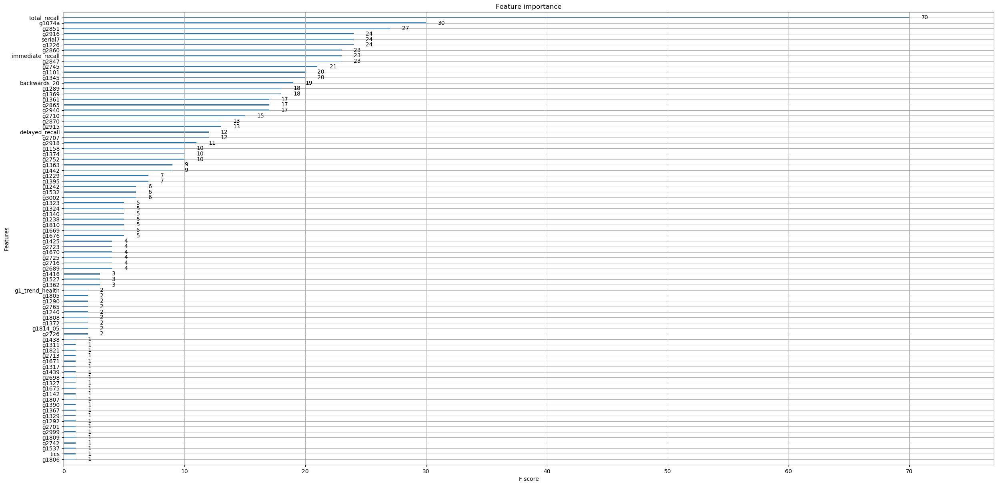

In [45]:
# Plot feature importance

X = pd.DataFrame(data=X, columns=features1)
model = clf.fit(X, y.values.ravel())

plt.rcParams["figure.figsize"] = (30,15)
xgb.plot_importance(model)
plt.rcParams.update(plt.rcParamsDefault)

Optimal number of features : 47
Optimal features: 

['total_recall', 'serial7', 'tics', 'backwards_20', 'immediate_recall', 'delayed_recall', 'g1101', 'g1074a', 'g1158', 'g1226', 'g1240', 'g1242', 'g1289', 'g1290', 'g1323', 'g1329', 'g1340', 'g1345', 'g1361', 'g1363', 'g1369', 'g1374', 'g1395', 'g1416', 'g1425', 'g1442', 'g1805', 'g1814_05', 'g1814', 'g2707', 'g2710', 'g2723', 'g2725', 'g2726', 'g2745', 'g2755', 'g2847', 'g2851', 'g2860', 'g2865', 'g2870', 'g2915', 'g2916', 'g2918', 'g2940', 'g3002', 'g1_trend_health']


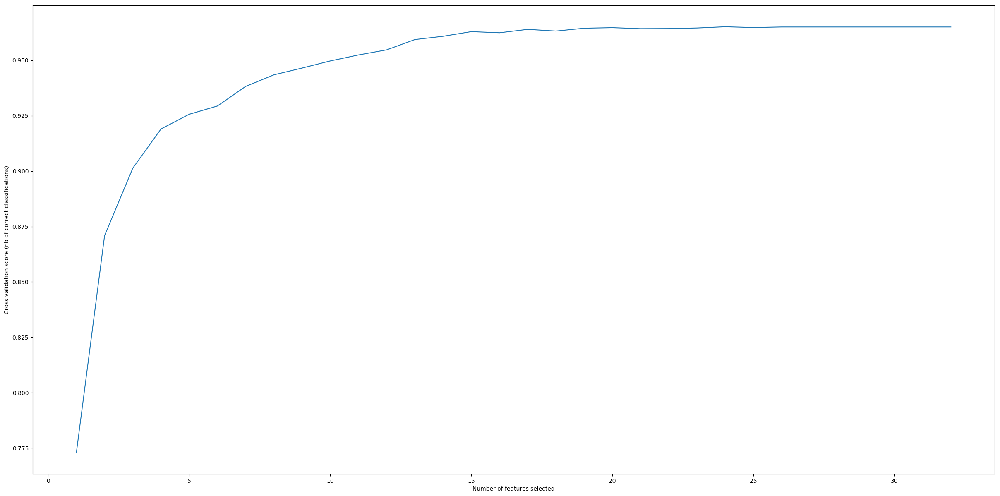

In [46]:
X = df.loc[:,features2]

# Examaine features
X_transformed = StandardScaler().fit_transform(X)

# Create the RFE object and compute a cross-validated score.

clf = xgb.XGBClassifier(random_state=0)
# The "accuracy" scoring is proportional to the number of correct
# classifications
rfecv = RFECV(estimator=clf, step=2, cv=StratifiedKFold(5),
              scoring='f1_micro')
rfecv.fit(X, y)


print("Optimal number of features : %d" % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)

print ('Optimal features: \n')
features2_1 = np.array(features2)[rfecv.support_].tolist()
print (features2_1)


Text(0.5,1,'Feature Importance')

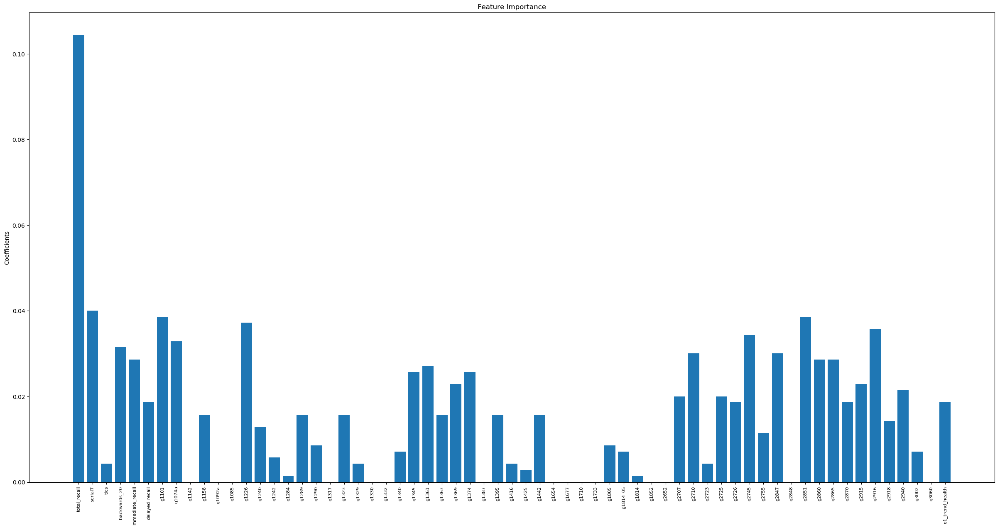

In [47]:
# Just plot features

model = clf.fit(X, y)

x = model.feature_importances_
names = X.columns.tolist()
y_pos = np.arange(len(names))

plt.bar(y_pos, x,)
plt.xticks(y_pos, names, rotation='vertical', fontsize=8)
plt.ylabel('Coefficients')
plt.title('Feature Importance')

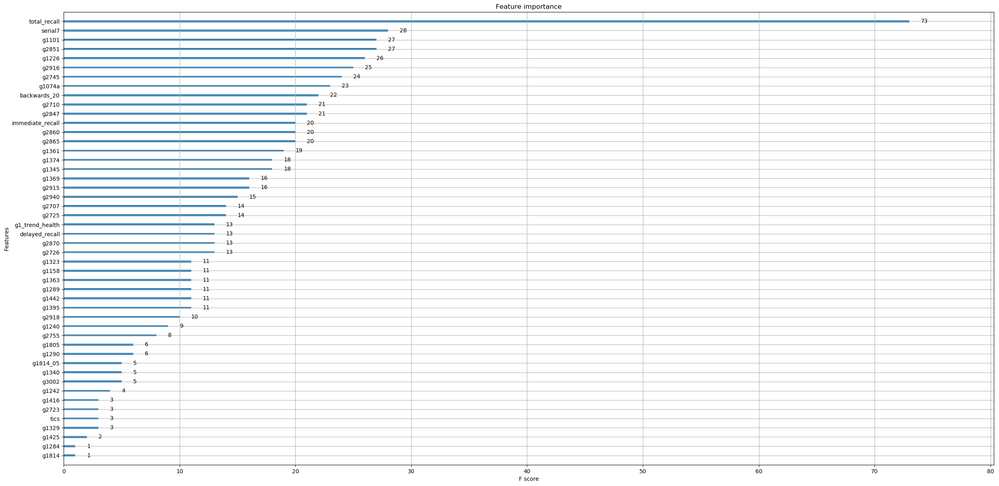

In [48]:
# Plot feature importance

X = pd.DataFrame(data=X, columns=features2)
model = clf.fit(X, y.values.ravel())

plt.rcParams["figure.figsize"] = (30,15)
xgb.plot_importance(model)
plt.rcParams.update(plt.rcParamsDefault)

### Other Explorations
    * Run model on ADAMS 
    * HRS on brain health 3 without scores
    * Imbalanced classes

In [134]:
## Just ADAMS
X = df.loc[df['adams']==1, :]
X = X.iloc[:,5:-1]
X['time'] = X['g1814'] - X['g1805']
y = df.loc[df['adams']==1, ['brain_health_diag2']]

In [ ]:
# Use HRS with brain_health_3

X = df.iloc[:,11:-1]
y = df['brain_health_3']
feature_names = X.columns.tolist()


In [1]:
# Only required for imbalance experiments
!conda install -y -c glemaitre imbalanced-learn

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.5.6
  latest version: 4.5.9

Please update conda by running

    $ conda update -n base conda



## Package Plan ##

  environment location: /opt/conda

  added / updated specs: 
    - imbalanced-learn


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    imbalanced-learn-0.3.1     |     pyh2cb239c_0          75 KB  glemaitre
    openssl-1.0.2o             |       h470a237_1         3.5 MB  conda-forge
    ------------------------------------------------------------
                                           Total:         3.6 MB

The following NEW packages will be INSTALLED:

    imbalanced-learn: 0.3.1-pyh2cb239c_0 glemaitre  

The following packages will be UPDATED:

    openssl:          1.0.2o-0           conda-forge --> 1.0.2o-h470a237_1 conda-forge


imbalanced-learn-0.3 |   75 KB | ####

In [57]:
from imblearn.over_sampling import SMOTE, ADASYN

In [58]:
features2_1 = [
 'total_recall',
 'serial7',
 #'tics', removed
 'backwards_20',
 'immediate_recall',
 'delayed_recall',
 'g1101',
 'g1074a',
 'g1158',
 'g1226',
 'g1240',
 'g1242',
 'g1289',
 'g1290',
 'g1323',
 'g1329',
 'g1340',
 'g1345',
 'g1361',
 'g1363',
 'g1369',
 'g1374',
 'g1395',
 'g1416',
 'g1425',
 'g1442',
 #'g1805',
 #'g1814_05',
 #'g1814', removed 
 'g2707',
 'g2710',
 'g2723',
 'g2725',
 'g2726',
 'g2745',
 'g2755',
 'g2847',
 'g2851',
 'g2860',
 'g2865',
 'g2870',
 'g2915',
 'g2916',
 'g2918',
 'g2940',
 'g3002',
 'g1_trend_health'
]

In [59]:
# Features
features2_1.sort()
print(features2_1)
print(len(features2_1))

['backwards_20', 'delayed_recall', 'g1074a', 'g1101', 'g1158', 'g1226', 'g1240', 'g1242', 'g1289', 'g1290', 'g1323', 'g1329', 'g1340', 'g1345', 'g1361', 'g1363', 'g1369', 'g1374', 'g1395', 'g1416', 'g1425', 'g1442', 'g1_trend_health', 'g2707', 'g2710', 'g2723', 'g2725', 'g2726', 'g2745', 'g2755', 'g2847', 'g2851', 'g2860', 'g2865', 'g2870', 'g2915', 'g2916', 'g2918', 'g2940', 'g3002', 'immediate_recall', 'serial7', 'total_recall']
43


In [60]:
X = df.loc[:,features2_1]
y = df['kmeans']

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train = pd.DataFrame(data=X_train, columns=features2_1)
X_test = pd.DataFrame(data=X_test, columns=features2_1)


Classification report: 
             precision    recall  f1-score   support

          0       0.98      0.99      0.98      4459
          1       0.97      0.93      0.95      1415

avg / total       0.98      0.98      0.98      5874



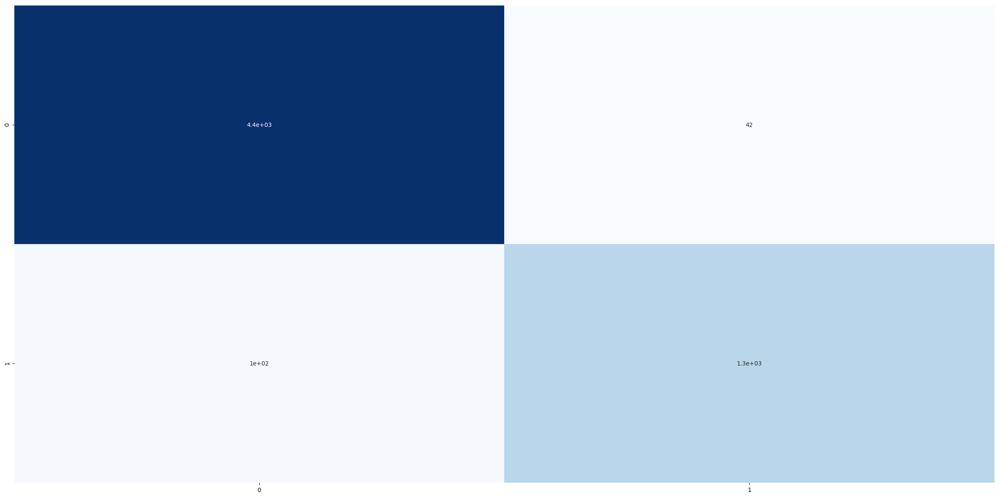

In [62]:
# Estimate and examine model
clf = xgb.XGBClassifier(objective='binary:logistic', gamma=0.5, min_child_weight=1, max_depth=3, learning_rate=0.3, seed=42)
model = clf.fit(X_train,y_train)
y_pred = model.predict(X_test)

confusion = confusion_matrix(y_test, y_pred)
sns.heatmap(pd.DataFrame(confusion), annot=True, cbar=None, cmap='Blues')
print ('Classification report: \n{}'.format(classification_report(y_test, y_pred)))


Classification report: 
             precision    recall  f1-score   support

          0       0.98      0.99      0.98      4459
          1       0.96      0.94      0.95      1415

avg / total       0.98      0.98      0.98      5874



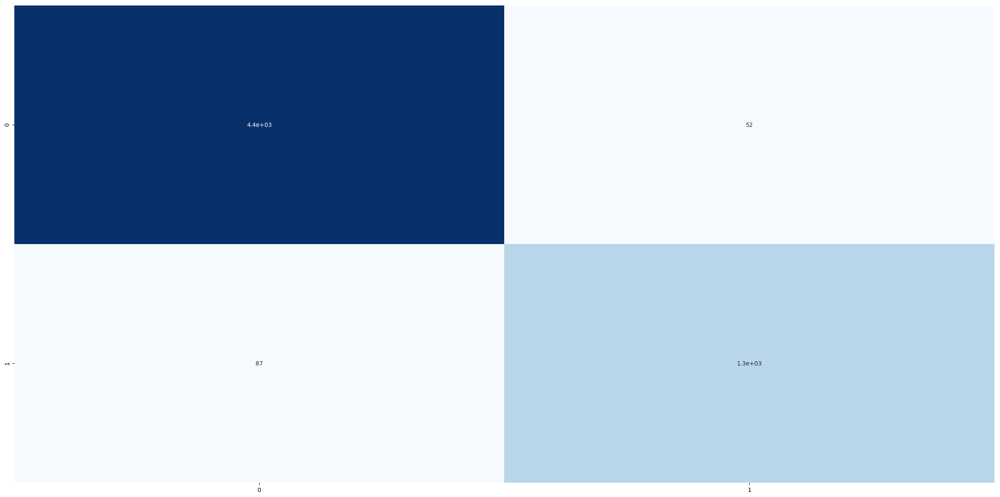

In [63]:
# Over-sampling using SMOTE
X_resampled, y_resampled = SMOTE().fit_sample(X_train, y_train)
#sns.countplot(y_resampled)


X_resampled = pd.DataFrame(data=X_resampled, columns=features2_1)

model = clf.fit(X_resampled,y_resampled)
y_pred = model.predict(X_test)

confusion = confusion_matrix(y_test, y_pred)
sns.heatmap(pd.DataFrame(confusion), annot=True, cbar=None, cmap='Blues')
print ('Classification report: \n{}'.format(classification_report(y_test, y_pred)))



Classification report: 
             precision    recall  f1-score   support

          0       0.98      0.99      0.98      4459
          1       0.96      0.94      0.95      1415

avg / total       0.98      0.98      0.98      5874



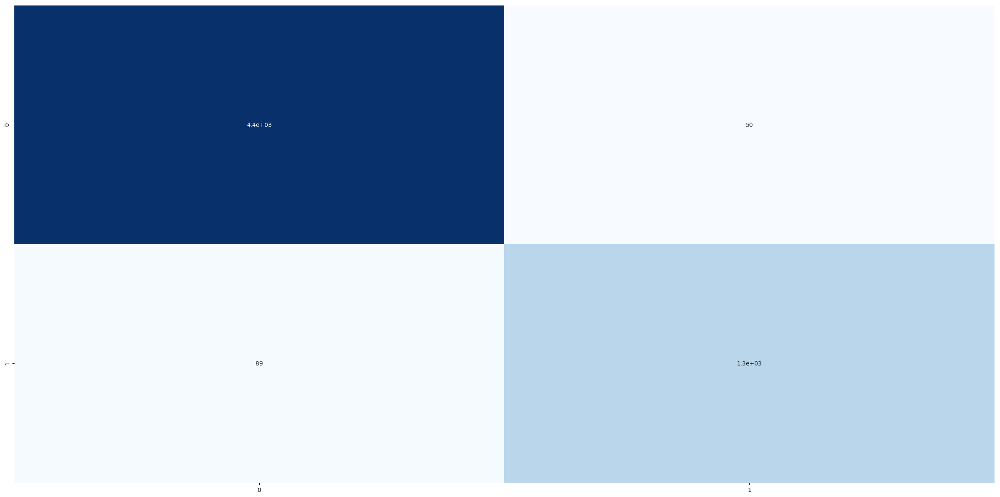

In [64]:
# Over-sampling using ADSYN
X_resampled, y_resampled = ADASYN().fit_sample(X_train, y_train)
#sns.countplot(y_resampled)


X_resampled = pd.DataFrame(data=X_resampled, columns=features2_1)

model = clf.fit(X_resampled,y_resampled)
y_pred = model.predict(X_test)

confusion = confusion_matrix(y_test, y_pred)
sns.heatmap(pd.DataFrame(confusion), annot=True, cbar=None, cmap='Blues')
print ('Classification report: \n{}'.format(classification_report(y_test, y_pred)))



**CONCLUSION: OVERSAMPLING DOESNT IMPROVE RECALL**

## Final Feature Set & Tuning

* **Target: Label from Kmeans**
* **Algo: XGBoost**
* **Features: features2**

In [65]:
# Load data
df = pd.read_csv(LOCAL_DIR + 'brainFitDx/data/sample/sample_2000_for_model.csv')

In [66]:
df.head(5)

,hhidpn,brain_health_1,brain_health_2,brain_health_3,total_cog,total_recall,serial7,tics,backwards_20,immediate_recall,...,g2918,g2940,g2995,g2996,g2999,g3002,g3060,adams,brain_health_diag2,kmeans
0,2010,0,1,1,14.0,8,0,6.0,2,5,...,0,0.0,5,0.0,4.0,1,1.0,NaN,NaN,0
1,3010,0,0,0,24.0,20,4,0.0,2,10,...,0,0.0,1,200.0,2.0,1,2.0,NaN,NaN,0
2,3020,0,0,0,16.0,11,5,0.0,2,6,...,0,0.0,1,10.0,0.0,5,2.0,NaN,NaN,0
3,10001010,0,0,0,19.0,14,5,0.0,2,7,...,0,0.0,5,0.0,130.0,1,4.0,NaN,NaN,0
4,10003030,0,0,0,25.0,20,5,0.0,2,10,...,0,0.0,5,0.0,0.0,5,4.0,NaN,NaN,0


In [67]:
features2 = [
    'total_recall',
 'serial7',
 'tics',
 'backwards_20',
 'immediate_recall',
 'delayed_recall',
 'g1101',
 'g1074a',
 'g1142',
 'g1158',
 'g1092a',
 'g1085',
 'g1226',
 'g1240',
 'g1242',
 'g1284',
 'g1289',
 'g1290',
 'g1317',
 'g1323',
 'g1329',
 'g1330',
 'g1332',
 'g1340',
 'g1345',
 'g1361',
 'g1363',
 'g1369',
 'g1374',
 'g1387',
 'g1395',
 'g1416',
 'g1425',
 'g1442',
 'g1654',
 'g1677',
 'g1710',
 'g1733',
 'g1805',
 'g1814_05',
 'g1814',
 'g1852',
 'g2652',
 'g2707',
 'g2710',
 'g2723',
 'g2725',
 'g2726',
 'g2745',
 'g2755',
 'g2847',
 'g2848',
 'g2851',
 'g2860',
 'g2865',
 'g2870',
 'g2915',
 'g2916',
 'g2918',
 'g2940',
 'g3002',
 'g3060',
 'g1_trend_health'
]

In [68]:
features0 = [
 'total_recall',
 'serial7',
 'tics',
 'backwards_20',
 'immediate_recall',
 'delayed_recall',
 'g1101',
 'g1074a',
 'g1158',
 'g1092a',
 'g1085',
 'g1226',
 'g1240',
 'g1284',
 'g1290',
 'g1317',
 'g1323',
 'g1330',
 'g1374',
 'g1416',
 'g1425',
 'g1710',
 'g1733',
 'g1805',
 'g1814_05',
 'g1814',
 'g1852',
 'g2652',
 'g2725',
 'g2745',
 'g2755',
 'g2847',
 'g2848',
 'g2851',
 'g2865',
 'g2870',
 'g2916',
 'g2918',
 'g2940',
 'g3002',
 'g3060'
]

In [69]:
features2_1 = [
 'total_recall',
 'serial7',
 #'tics', removed
 'backwards_20',
 'immediate_recall',
 'delayed_recall',
 'g1101',
 'g1074a',
 'g1158',
 'g1226',
 'g1240',
 'g1242',
 'g1289',
 'g1290',
 'g1323',
 'g1329',
 'g1340',
 'g1345',
 'g1361',
 'g1363',
 'g1369',
 'g1374',
 'g1395',
 'g1416',
 'g1425',
 'g1442',
 #'g1805',
 #'g1814_05',
 #'g1814', removed 
 'g2707',
 'g2710',
 'g2723',
 'g2725',
 'g2726',
 'g2745',
 'g2755',
 'g2847',
 'g2851',
 'g2860',
 'g2865',
 'g2870',
 'g2915',
 'g2916',
 'g2918',
 'g2940',
 'g3002',
 'g1_trend_health'
]

In [70]:
list_of_features = [features0, features2, features2_1]

In [71]:
def compare_features(df,features):
    
    X = df.loc[:, features]
    y = df['kmeans']
    
    #scaler = StandardScaler()
    #X = scaler.fit_transform(X)
    
    # Create train, test data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    X_train = pd.DataFrame(data=X_train, columns=features)
    X_test = pd.DataFrame(data=X_test, columns=features)
    
    # Model 
    clf = xgb.XGBClassifier(gamma=0, learning_rate=0.3, max_depth=3, min_child_weight=1, random_state=42)
    model = clf.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print ('Model using feature set {}\n'.format(features))
    print ('Number of features: {}\n'.format(len(features)))
    print ('Clasification report:\n {}'.format(classification_report(y_test, y_pred)))
    
    # Feature importance
    plt.rcParams["figure.figsize"] = (30,25)
    xgb.plot_importance(model)
    plt.rcParams.update(plt.rcParamsDefault)


Model using feature set ['total_recall', 'serial7', 'tics', 'backwards_20', 'immediate_recall', 'delayed_recall', 'g1101', 'g1074a', 'g1158', 'g1092a', 'g1085', 'g1226', 'g1240', 'g1284', 'g1290', 'g1317', 'g1323', 'g1330', 'g1374', 'g1416', 'g1425', 'g1710', 'g1733', 'g1805', 'g1814_05', 'g1814', 'g1852', 'g2652', 'g2725', 'g2745', 'g2755', 'g2847', 'g2848', 'g2851', 'g2865', 'g2870', 'g2916', 'g2918', 'g2940', 'g3002', 'g3060']

Number of features: 41

Clasification report:
              precision    recall  f1-score   support

          0       0.97      0.98      0.97      4459
          1       0.92      0.89      0.91      1415

avg / total       0.96      0.96      0.96      5874

Model using feature set ['total_recall', 'serial7', 'tics', 'backwards_20', 'immediate_recall', 'delayed_recall', 'g1101', 'g1074a', 'g1142', 'g1158', 'g1092a', 'g1085', 'g1226', 'g1240', 'g1242', 'g1284', 'g1289', 'g1290', 'g1317', 'g1323', 'g1329', 'g1330', 'g1332', 'g1340', 'g1345', 'g1361', 'g1363'

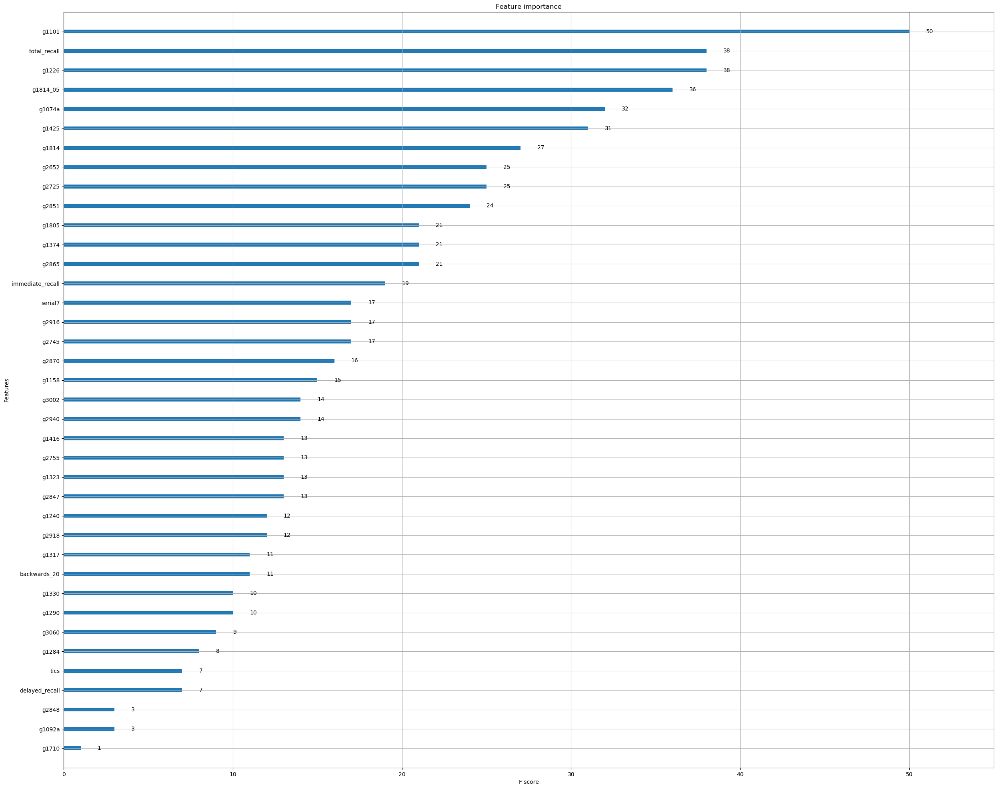

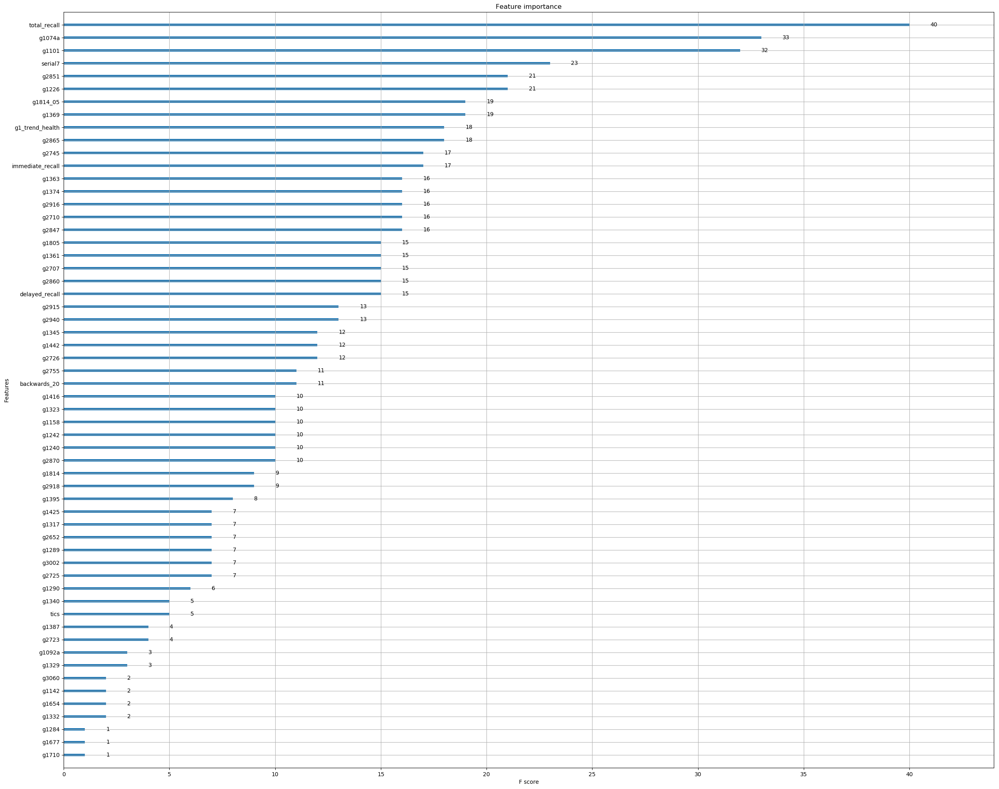

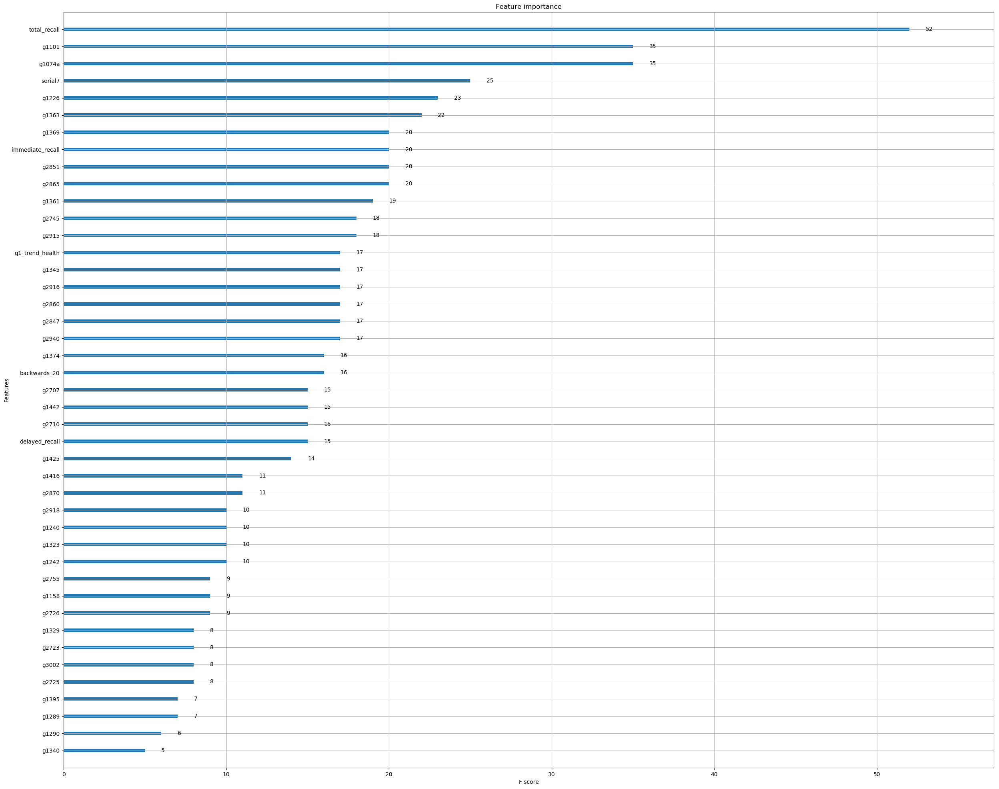

In [72]:
for i in list_of_features:
    compare_features(df, i)

** => USE 43 FEATURES ** (NOTE: DROPPING TICS, 1805-1814)

In [73]:
# Parameter tuning


X = df.loc[:, features2_1]
y = df['kmeans']

#scaler = StandardScaler()
#X = scaler.fit_transform(X)

# Create train, test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
X_train = pd.DataFrame(data=X_train, columns=features2_1)
X_test = pd.DataFrame(data=X_test, columns=features2_1)

# Set the parameters by cross-validation
 
tuned_parameters = [{'learning_rate': [0.01, 0.1, 0.2, 0.3], 'min_child_weight': [1, 2, 3],
                     'max_depth': [3, 5, 10], 'gamma': [0, 0.5]
                    }]
scores = ['precision', 'recall']

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    clf = GridSearchCV(xgb.XGBClassifier(), tuned_parameters, cv=5, scoring='%s_macro' % score)
    clf.fit(X_train, y_train.values.ravel())

    print("Best parameters set found on training set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on training set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the training set.")
    print("The scores are computed on the full test set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    

# Tuning hyper-parameters for precision

Best parameters set found on training set:

{'gamma': 0.5, 'learning_rate': 0.3, 'max_depth': 3, 'min_child_weight': 3}

Grid scores on training set:

0.921 (+/-0.012) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 1}
0.921 (+/-0.012) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 2}
0.921 (+/-0.012) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 3}
0.930 (+/-0.015) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 5, 'min_child_weight': 1}
0.929 (+/-0.015) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 5, 'min_child_weight': 2}
0.929 (+/-0.017) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 5, 'min_child_weight': 3}
0.935 (+/-0.007) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 10, 'min_child_weight': 1}
0.935 (+/-0.009) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 10, 'min_child_weight': 2}
0.936 (+/-0.009) for {'gamma': 0, 'lea

In [74]:
# Parameter tuning

# Set the parameters by cross-validation
 
tuned_parameters = [{'learning_rate': [0.01, 0.1, 0.2, 0.3], 'min_child_weight': [1, 2, 3],
                     'max_depth': [3, 5, 10], 'gamma': [0, 0.5]
                    }]
scores = ['f1', 'f1_micro']

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    clf = GridSearchCV(xgb.XGBClassifier(), tuned_parameters, cv=5, scoring='%s' % score)
    clf.fit(X_train, y_train.values.ravel())

    print("Best parameters set found on training set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on training set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the training set.")
    print("The scores are computed on the test set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    

# Tuning hyper-parameters for f1

Best parameters set found on training set:

{'gamma': 0.5, 'learning_rate': 0.3, 'max_depth': 3, 'min_child_weight': 3}

Grid scores on training set:

0.810 (+/-0.031) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 1}
0.810 (+/-0.031) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 2}
0.810 (+/-0.031) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 3}
0.864 (+/-0.023) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 5, 'min_child_weight': 1}
0.862 (+/-0.023) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 5, 'min_child_weight': 2}
0.863 (+/-0.025) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 5, 'min_child_weight': 3}
0.887 (+/-0.011) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 10, 'min_child_weight': 1}
0.888 (+/-0.014) for {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 10, 'min_child_weight': 2}
0.890 (+/-0.015) for {'gamma': 0, 'learning_r

**FOR RECALL BEST SEEMS TO BE GAMMA =0.5, LEARNING RATE =0.3, MAX_DEPTH=3, MIN_CHILD=1**

For F1, precision gamma': 0.5, 'learning_rate': 0.3, 'max_depth': 3, 'min_child_weight': 3

In [82]:
# Feature optimizing

def modelfit(alg, dtrain, predictors, useTrainCV=True, cv_folds=5, early_stopping_rounds=50):
    
    if useTrainCV:
        xgb_param = alg.get_xgb_params()
        xgtrain = xgb.DMatrix(dtrain[predictors].values, label=dtrain[target].values)
        cvresult = xgb.cv(xgb_param, xgtrain, num_boost_round=alg.get_params()['n_estimators'], nfold=cv_folds, 
                          metrics='auc', early_stopping_rounds=early_stopping_rounds,)
        alg.set_params(n_estimators=cvresult.shape[0])
    
    
    #Fit the algorithm on the data
    alg.fit(dtrain[predictors], dtrain[target],eval_metric='auc')
        
    #Predict training set:
    dtrain_predictions = alg.predict(dtrain[predictors])
    dtrain_predprob = alg.predict_proba(dtrain[predictors])[:,1]
        
    #Print model report:
    print ("\nModel Report")
    print ("Accuracy : %.4g" % accuracy_score(dtrain[target].values, dtrain_predictions))
    print ("Recall Score (Train): %f" % roc_auc_score(dtrain[target], dtrain_predprob))
                    
    plt.rcParams["figure.figsize"] = (30,25)
    feat_imp = pd.Series(alg.feature_importances_).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')
    plt.rcParams.update(plt.rcParamsDefault)


Model Report
Accuracy : 0.9924
Recall Score (Train): 0.999696


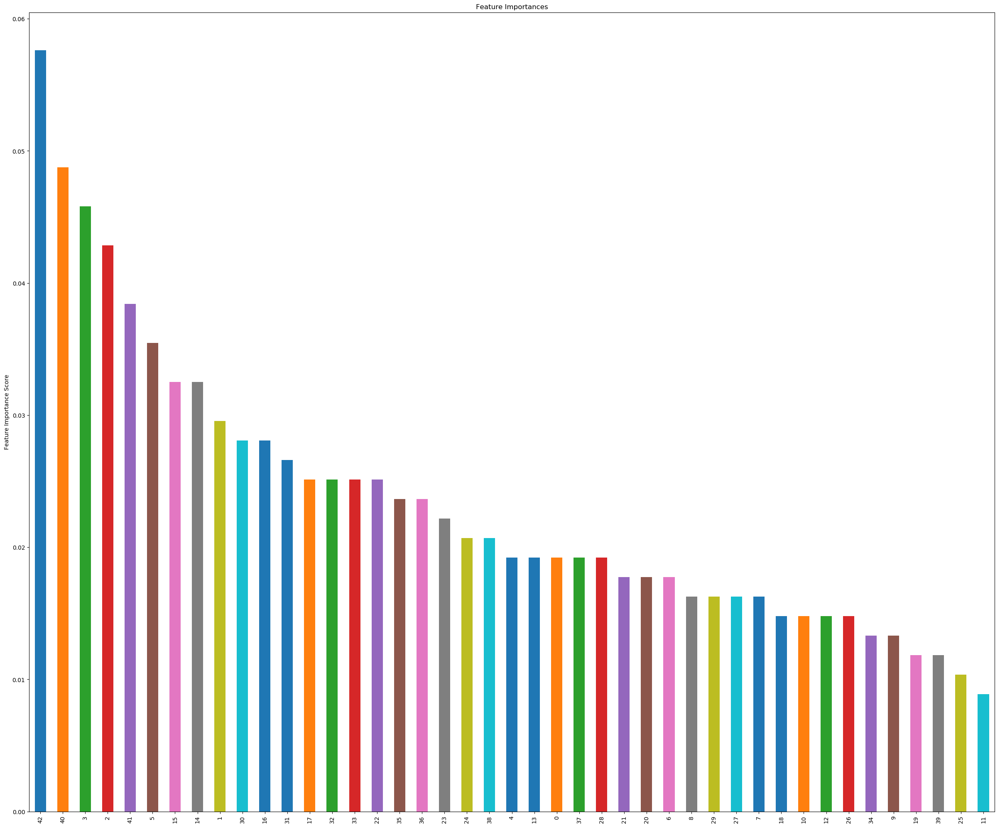

In [83]:
#Choose all predictors except target

train = df
target = 'kmeans'
predictors = features2_1

xgb1 = xgb.XGBClassifier(
 learning_rate =0.3,
 n_estimators=100,
 max_depth=3,
 min_child_weight=1,
 gamma=0.5,
 subsample=0.8,
 colsample_bytree=0.8,
 objective= 'binary:logistic',
 nthread=4,
 scale_pos_weight=1,
 seed=27)

modelfit(xgb1, train, predictors)

In [84]:
param_test1 = {
 'max_depth':[3,10],
 'min_child_weight':[1,6]
}

clf = xgb.XGBClassifier(random_state=42)

model = clf.fit(train[predictors],train[target])
print (model.score(train[predictors],train[target]))

gsearch1 = GridSearchCV(xgb.XGBClassifier(), param_test1, scoring='roc_auc', cv=5)
gsearch1.fit(train[predictors],train[target])
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_

0.978957045814


/opt/conda/lib/python3.6/site-packages/sklearn/model_selection/_search.py:761: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: 0.99592, std: 0.00066, params: {'max_depth': 3, 'min_child_weight': 1},
  mean: 0.99586, std: 0.00074, params: {'max_depth': 3, 'min_child_weight': 6},
  mean: 0.99565, std: 0.00099, params: {'max_depth': 10, 'min_child_weight': 1},
  mean: 0.99658, std: 0.00070, params: {'max_depth': 10, 'min_child_weight': 6}],
 {'max_depth': 10, 'min_child_weight': 6},
 0.99657969159010684)

# Final Model, Saving

In [8]:
# Features
features2_1.sort()
print(features2_1)
print(len(features2_1))


['backwards_20', 'delayed_recall', 'g1074a', 'g1101', 'g1158', 'g1226', 'g1240', 'g1242', 'g1289', 'g1290', 'g1323', 'g1329', 'g1340', 'g1345', 'g1361', 'g1363', 'g1369', 'g1374', 'g1395', 'g1416', 'g1425', 'g1442', 'g1_trend_health', 'g2707', 'g2710', 'g2723', 'g2725', 'g2726', 'g2745', 'g2755', 'g2847', 'g2851', 'g2860', 'g2865', 'g2870', 'g2915', 'g2916', 'g2918', 'g2940', 'g3002', 'immediate_recall', 'serial7', 'total_recall']
43


In [9]:
X = df.loc[:,features2_1]
y = df['kmeans']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
X_train = pd.DataFrame(data=X_train, columns=features2_1)
X_test = pd.DataFrame(data=X_test, columns=features2_1)


In [10]:
# Save the model
train_data = xgb.DMatrix(X_train, y_train)
param = {'max_depth':3, 'eta':0.3, 'silent':1, 'gamma':0.5, 'min_child_weight':1, 'seed':42}
num_round = 10
model = xgb.train(param, train_data, num_round)

pkl.dump(model, open('xgb_model.pkl','wb'), protocol=2)

In [122]:
# Load model
xgb_model = pkl.load(open('xgb_model.pkl','rb'))

In [219]:
# Save to file
X_test = X_test.iloc[1:2,]
#X_test.to_csv('testinput.csv', index=False)
X_test.to_json('testinput.json',orient='records')

In [220]:
X_test

,backwards_20,delayed_recall,g1074a,g1101,g1158,g1226,g1240,g1242,g1289,g1290,...,g2865,g2870,g2915,g2916,g2918,g2940,g3002,immediate_recall,serial7,total_recall
4881,2,3,10,60,1,3,0,0,5,0,...,5,5,1,5,0,0.0,1,4,3,7


In [221]:
with open('testinput.json') as json_file:  
    json_df = json.load(json_file)


In [224]:
json.dumps(json_df)

'[{"backwards_20": 2, "delayed_recall": 3, "g1074a": 10, "g1101": 60, "g1158": 1, "g1226": 3, "g1240": 0, "g1242": 0, "g1289": 5, "g1290": 0, "g1323": 0, "g1329": 5, "g1340": 0.0, "g1345": 0, "g1361": 3, "g1363": 3, "g1369": 2, "g1374": 0, "g1395": 5, "g1416": 0.0, "g1425": 180, "g1442": 5, "g1_trend_health": 0, "g2707": 5, "g2710": 5, "g2723": 5, "g2725": 5, "g2726": 5, "g2745": 0, "g2755": 0, "g2847": 0, "g2851": 5, "g2860": 1, "g2865": 5, "g2870": 5, "g2915": 1, "g2916": 5, "g2918": 0, "g2940": 0.0, "g3002": 1, "immediate_recall": 4, "serial7": 3, "total_recall": 7}]'

In [225]:
load_df = pd.read_json('testinput.json')

In [226]:
load_df

,backwards_20,delayed_recall,g1074a,g1101,g1158,g1226,g1240,g1242,g1289,g1290,...,g2865,g2870,g2915,g2916,g2918,g2940,g3002,immediate_recall,serial7,total_recall
0,2,3,10,60,1,3,0,0,5,0,...,5,5,1,5,0,0,1,4,3,7


In [127]:
temp = load_df.columns.tolist()
temp_df = pd.DataFrame(temp)
temp_df.to_csv('finalfeatures.csv', header=False, index=False)

In [140]:
load_df.head(4)

,backwards_20,delayed_recall,g1074a,g1101,g1158,g1226,g1240,g1242,g1289,g1290,...,g2865,g2870,g2915,g2916,g2918,g2940,g3002,immediate_recall,serial7,total_recall
4881,2,3,10,60,1,3,0,0,5,0,...,5,5,1,5,0,0,1,4,3,7


In [182]:
# Do prediction
load_data_matrix = xgb.DMatrix(load_df)

In [183]:
# Predict
preds = xgb_model.predict(load_data_matrix)

In [184]:
preds

array([ 0.23605439], dtype=float32)

/opt/conda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


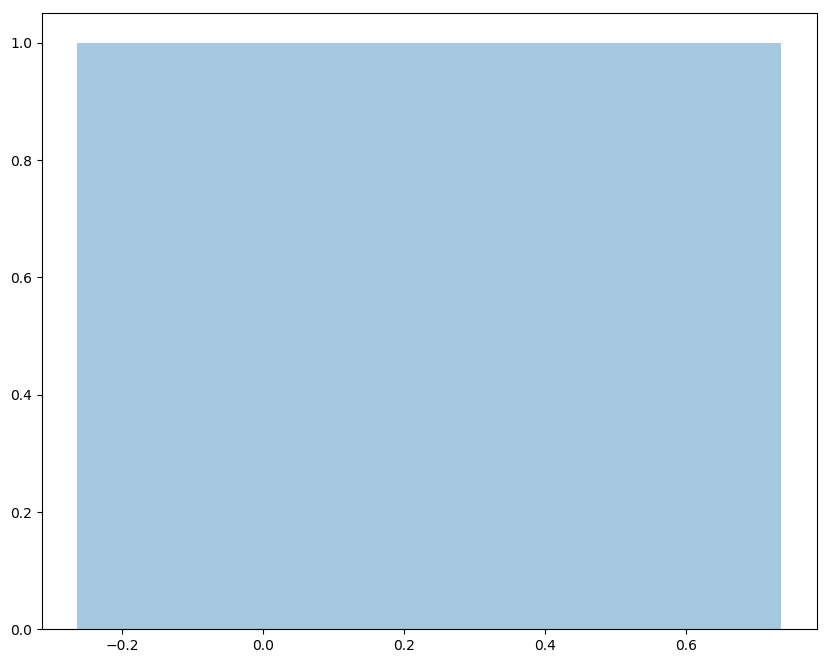

In [131]:
plt.rcParams["figure.figsize"] = (10,8)
sns.distplot(preds, kde=False)
plt.rcParams.update(plt.rcParamsDefault)

In [132]:
%%writefile xgb_model.py
# Program to load model and predict class
# Input: xgb_model.py %1 where %1 is a csv file of features
# Output: array of predictions

import os
import sys
import xgboost as xgb
import pandas as pd
import json
import pickle as pkl

# Load model
xgb_model = pkl.load(open('xgb_model.pkl','rb'))

# Read csv file
inputcvs = pd.read_json(str(sys.argv[1]))
                       
# Process data
load_data_matrix = xgb.DMatrix(inputcvs)
print(xgb_model.predict(load_data_matrix))                       
                       
                                     

Overwriting xgb_model.py


In [133]:
!python xgb_model.py testinput.json

[ 0.23605439]


## Compare 40 and 43 Features

In [36]:
# Common features
set(features0).intersection(set(features2_1))

{'backwards_20',
 'delayed_recall',
 'g1074a',
 'g1101',
 'g1158',
 'g1226',
 'g1240',
 'g1290',
 'g1323',
 'g1374',
 'g1416',
 'g1425',
 'g2725',
 'g2745',
 'g2755',
 'g2847',
 'g2851',
 'g2865',
 'g2870',
 'g2916',
 'g2918',
 'g2940',
 'g3002',
 'immediate_recall',
 'serial7',
 'total_recall'}

In [37]:
# New features
set(features0).difference(set(features2_1))

{'g1085',
 'g1092a',
 'g1284',
 'g1317',
 'g1330',
 'g1710',
 'g1733',
 'g1805',
 'g1814',
 'g1814_05',
 'g1852',
 'g2652',
 'g2848',
 'g3060',
 'tics'}

In [85]:
# New features
set(features2).difference(set(features2_1))

{'g1085',
 'g1092a',
 'g1142',
 'g1284',
 'g1317',
 'g1330',
 'g1332',
 'g1387',
 'g1654',
 'g1677',
 'g1710',
 'g1733',
 'g1805',
 'g1814',
 'g1814_05',
 'g1852',
 'g2652',
 'g2848',
 'g3060',
 'tics'}